## Code-100 (As identified in the Flowchart in the Thesis)

#### About This Document
This document is part of the coursework for the Dissertation Module (CASA0004/0010) at UCL CASA. You can find the source code [here](https://github.com/burhanucl2023/) and the data associated [here](https://github.com/burhanucl2023/)

### What does this Code Do ?

This is the first in a series of four codes designed to thoroughly analyze the impact of the PMGSY road construction program in India on rural development, using nighttime light data as an indicator of economic activity. In this document, we prepare our final dataset which will later be used for conducting the econometric analysis.

**1. Data Used in this Code:**
   - **Road Data**: Information on road construction dates and costs from the SHRUG dataset provided by the Development Data Lab.
   - **Nighttime Light Data**: Data from Google Earth Engine, covering 1995 to 2020, obtained via GEE.
   - **Terrain Data**: Elevation and ruggedness data from SRTM, also provided by the Development Data Lab.
   - **Zonal Boundaries**: Derived from the SHRUG dataset and the State Boundaries Data of India, using the Shrid State Code.

**2. Objectives of this Code:**
   - Identify the first completion year of road construction in each village (shrid).
   - Distinguish between villages with and without PMGSY roads.
   - Use data from 1995 to 2020, covering the period before and after the start of the PMGSY program in 2000.
   - Standardize the data for analysis.
   - Incorporate zonal data to add regional zones of India to the final dataset.
   - Include Terrain Ruggedness Index (TRI Mean) and Elevation Mean (Elev Mean) in the dataset.
   - Add Nighttime Light values for each shrid from 1995 to 2020.

**3. Result:**
   - Create a comprehensive dataset for descriptive and econometric analysis to study the impact of the PMGSY road construction program on rural development using nighttime light data.

This document details the steps and code used, ensuring the analysis is transpaent and reproducible.


In [17]:
# import pandas
import pandas as pd


# load pmgsy data
df = pd.read_stata("C:/Users/Burhan/Downloads/shrug-pmgsy-dta/pmgsy_2015_shrid.dta")

In [2]:
df

,shrid,road_award_date_new,road_award_date_upg,road_comp_date_new,road_comp_date_upg,road_comp_date_stip_new,road_comp_date_stip_upg,road_sanc_year_new,road_sanc_year_upg,road_length_new,road_length_upg,road_cost_new,road_cost_upg,road_cost_sanc_new,road_cost_sanc_upg,road_cost_state_new,road_cost_state_upg,road_name_new,road_name_upg
0,01-03-01-0002-00008200,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
1,01-03-01-0002-00008300,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
2,01-03-01-0002-00009300,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
3,01-03-01-0002-00009500,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
4,01-03-01-0002-00009700,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
573563,11-35-640-05924-645566,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
573564,11-35-640-05924-645567,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
573565,11-35-640-05924-645568,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,
573566,11-35-640-05924-645569,NaT,NaT,NaT,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,


In [3]:
df.describe()

,road_award_date_new,road_award_date_upg,road_comp_date_new,road_comp_date_upg,road_comp_date_stip_new,road_comp_date_stip_upg,road_sanc_year_new,road_sanc_year_upg,road_length_new,road_length_upg,road_cost_new,road_cost_upg,road_cost_sanc_new,road_cost_sanc_upg,road_cost_state_new,road_cost_state_upg
count,88103,43667,70674,42164,67143,40331,98719.000000,46873.000000,70231.000000,42164.000000,70231.000000,42164.000000,70231.000000,42164.000000,70231.000000,42164.000000
mean,2008-06-02 03:29:44.942624,2007-09-20 06:17:39.051457280,2009-01-05 04:01:31.688598528,2008-10-13 22:40:39.844417280,2008-02-16 13:01:46.644027648,2008-03-01 09:07:55.316754176,2007.194724,2006.171954,4.841702,7.381415,135.944427,189.967209,147.618179,201.589340,1.640868,0.586334
min,1960-01-01 00:00:00,1960-01-01 00:00:00,2000-02-01 00:00:00,2000-01-01 00:00:00,1960-01-01 00:00:00,1960-01-01 00:00:00,2000.000000,2000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2005-12-09 00:00:00,2006-04-28 00:00:00,2006-08-01 00:00:00,2007-07-01 00:00:00,2005-10-19 00:00:00,2006-12-28 00:00:00,2005.000000,2005.000000,2.000000,2.650000,42.520000,40.997501,47.720001,44.349998,0.000000,0.000000
50%,2008-03-25 00:00:00,2008-06-13 00:00:00,2008-12-01 00:00:00,2009-07-01 00:00:00,2008-03-11 00:00:00,2009-04-29 00:00:00,2007.000000,2007.000000,3.500000,5.550000,86.860001,127.114998,95.629997,134.304993,0.000000,0.000000
75%,2011-11-15 00:00:00,2009-07-06 00:00:00,2011-11-01 00:00:00,2010-09-01 00:00:00,2010-07-14 00:00:00,2010-03-15 00:00:00,2011.000000,2008.000000,6.100000,10.250000,172.509995,279.920013,189.020004,297.632507,0.000000,0.000000
max,2015-01-08 00:00:00,2015-01-03 00:00:00,2015-02-01 00:00:00,2015-03-01 00:00:00,2019-12-03 00:00:00,2019-06-05 00:00:00,2014.000000,2014.000000,75.000000,77.000000,2814.179932,2604.590088,2770.590088,2842.689941,1541.609985,272.359985
std,NaN,NaN,NaN,NaN,NaN,NaN,3.786583,3.501694,4.364726,6.556874,153.278046,201.454224,162.095871,214.729385,22.175318,9.670764


In [4]:
import pandas as pd
import numpy as np
# Ensuring datetime columns are in datetime format
df['road_award_date_new'] = pd.to_datetime(df['road_award_date_new'], errors='coerce')
df['road_award_date_upg'] = pd.to_datetime(df['road_award_date_upg'], errors='coerce')
df['road_comp_date_new'] = pd.to_datetime(df['road_comp_date_new'], errors='coerce')
df['road_comp_date_upg'] = pd.to_datetime(df['road_comp_date_upg'], errors='coerce')
df['road_comp_date_stip_new'] = pd.to_datetime(df['road_comp_date_stip_new'], errors='coerce')
df['road_comp_date_stip_upg'] = pd.to_datetime(df['road_comp_date_stip_upg'], errors='coerce')

# Converting the years to datetime for comparison
df['road_sanc_year_new'] = pd.to_datetime(df['road_sanc_year_new'], format='%Y', errors='coerce')
df['road_sanc_year_upg'] = pd.to_datetime(df['road_sanc_year_upg'], format='%Y', errors='coerce')

# Creating the new columns based on the logic provided
df['new_roads_start_year'] = df[['road_award_date_new', 'road_sanc_year_new']].max(axis=1)
df['upg_roads_start_year'] = df[['road_award_date_upg', 'road_sanc_year_upg']].max(axis=1)
df['new_roads_comp_year'] = df[['road_comp_date_new', 'road_comp_date_stip_new']].max(axis=1)
df['upg_roads_comp_year'] = df[['road_comp_date_upg', 'road_comp_date_stip_upg']].max(axis=1)

# Extracting only the year part from the datetime columns
df['new_roads_start_year'] = df['new_roads_start_year'].dt.year
df['upg_roads_start_year'] = df['upg_roads_start_year'].dt.year
df['new_roads_comp_year'] = df['new_roads_comp_year'].dt.year
df['upg_roads_comp_year'] = df['upg_roads_comp_year'].dt.year

# Creating the new columns based on the logic provided
df['cost_road_new'] = df[['road_cost_new', 'road_cost_sanc_new']].max(axis=1)
df['cost_road_upg'] = df[['road_cost_upg', 'road_cost_sanc_upg']].max(axis=1)

# Showing the head of the DataFrame to verify the changes
df.head()


,shrid,road_award_date_new,road_award_date_upg,road_comp_date_new,road_comp_date_upg,road_comp_date_stip_new,road_comp_date_stip_upg,road_sanc_year_new,road_sanc_year_upg,road_length_new,...,road_cost_state_new,road_cost_state_upg,road_name_new,road_name_upg,new_roads_start_year,upg_roads_start_year,new_roads_comp_year,upg_roads_comp_year,cost_road_new,cost_road_upg
0,01-03-01-0002-00008200,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaN,...,NaN,NaN,,,NaN,NaN,NaN,NaN,NaN,NaN
1,01-03-01-0002-00008300,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaN,...,NaN,NaN,,,NaN,NaN,NaN,NaN,NaN,NaN
2,01-03-01-0002-00009300,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaN,...,NaN,NaN,,,NaN,NaN,NaN,NaN,NaN,NaN
3,01-03-01-0002-00009500,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaN,...,NaN,NaN,,,NaN,NaN,NaN,NaN,NaN,NaN
4,01-03-01-0002-00009700,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaN,...,NaN,NaN,,,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Selecting the specified columns from the DataFrame
selected_columns = [
    'shrid', 
    'new_roads_start_year', 
    'upg_roads_start_year', 
    'new_roads_comp_year', 
    'upg_roads_comp_year', 
    'road_length_new', 
    'road_length_upg', 
    'cost_road_new',
    'cost_road_upg'
]

df_selected = df[selected_columns]

In [6]:
df_selected

,shrid,new_roads_start_year,upg_roads_start_year,new_roads_comp_year,upg_roads_comp_year,road_length_new,road_length_upg,cost_road_new,cost_road_upg
0,01-03-01-0002-00008200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01-03-01-0002-00008300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01-03-01-0002-00009300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01-03-01-0002-00009500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01-03-01-0002-00009700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
573563,11-35-640-05924-645566,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
573564,11-35-640-05924-645567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
573565,11-35-640-05924-645568,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
573566,11-35-640-05924-645569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df_selected.describe()

,new_roads_start_year,upg_roads_start_year,new_roads_comp_year,upg_roads_comp_year,road_length_new,road_length_upg,cost_road_new,cost_road_upg
count,98719.000000,46873.000000,70674.000000,42164.000000,70231.000000,42164.000000,70231.000000,42164.000000
mean,2008.200063,2007.319288,2008.704927,2008.463049,4.841702,7.381415,153.027649,208.807175
std,3.758315,3.504056,3.373308,3.170971,4.364726,6.556874,168.341446,220.504028
min,2000.000000,2000.000000,2000.000000,2000.000000,0.000000,0.000000,0.000000,0.000000
25%,2006.000000,2006.000000,2006.000000,2007.000000,2.000000,2.650000,49.650002,46.529999
50%,2008.000000,2008.000000,2009.000000,2009.000000,3.500000,5.550000,99.400002,140.899994
75%,2012.000000,2009.000000,2011.000000,2010.000000,6.100000,10.250000,195.839996,307.707520
max,2015.000000,2015.000000,2019.000000,2019.000000,75.000000,77.000000,2814.179932,2842.689941


In [8]:
df_selected

,shrid,new_roads_start_year,upg_roads_start_year,new_roads_comp_year,upg_roads_comp_year,road_length_new,road_length_upg,cost_road_new,cost_road_upg
0,01-03-01-0002-00008200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01-03-01-0002-00008300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01-03-01-0002-00009300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01-03-01-0002-00009500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01-03-01-0002-00009700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
573563,11-35-640-05924-645566,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
573564,11-35-640-05924-645567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
573565,11-35-640-05924-645568,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
573566,11-35-640-05924-645569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
import pandas as pd

# Initialize an empty list to collect rows for the long format DataFrame
long_data = []

# Iterate through each row in the df_selected DataFrame
for index, row in df_selected.iterrows():
    # Add new road data
    long_data.append([row['shrid'], row['new_roads_start_year'], row['new_roads_comp_year'], row['road_length_new'], row['cost_road_new'], 1])
    
    # Add upgraded road data
    long_data.append([row['shrid'], row['upg_roads_start_year'], row['upg_roads_comp_year'], row['road_length_upg'], row['cost_road_upg'], 0])

# Create the long format DataFrame from the long_data list
df_long = pd.DataFrame(long_data, columns=['shrid', 'start_year', 'end_year', 'road_length', 'road_cost', 'road_type'])


In [10]:
# Display the long format DataFrame
df_long

,shrid,start_year,end_year,road_length,road_cost,road_type
0,01-03-01-0002-00008200,NaN,NaN,NaN,NaN,1
1,01-03-01-0002-00008200,NaN,NaN,NaN,NaN,0
2,01-03-01-0002-00008300,NaN,NaN,NaN,NaN,1
3,01-03-01-0002-00008300,NaN,NaN,NaN,NaN,0
4,01-03-01-0002-00009300,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...
1147131,11-35-640-05924-645568,NaN,NaN,NaN,NaN,0
1147132,11-35-640-05924-645569,NaN,NaN,NaN,NaN,1
1147133,11-35-640-05924-645569,NaN,NaN,NaN,NaN,0
1147134,11-35-640-05924-645570,NaN,NaN,NaN,NaN,1


In [11]:
import pandas as pd
import numpy as np


# Create the treatment variable
df_long['treatment'] = df_long.groupby('shrid')['road_length'].transform(lambda x: np.where(x.notnull().any(), 1, 0))

# Display the updated DataFrame
df_long

,shrid,start_year,end_year,road_length,road_cost,road_type,treatment
0,01-03-01-0002-00008200,NaN,NaN,NaN,NaN,1,0
1,01-03-01-0002-00008200,NaN,NaN,NaN,NaN,0,0
2,01-03-01-0002-00008300,NaN,NaN,NaN,NaN,1,0
3,01-03-01-0002-00008300,NaN,NaN,NaN,NaN,0,0
4,01-03-01-0002-00009300,NaN,NaN,NaN,NaN,1,0
...,...,...,...,...,...,...,...
1147131,11-35-640-05924-645568,NaN,NaN,NaN,NaN,0,0
1147132,11-35-640-05924-645569,NaN,NaN,NaN,NaN,1,0
1147133,11-35-640-05924-645569,NaN,NaN,NaN,NaN,0,0
1147134,11-35-640-05924-645570,NaN,NaN,NaN,NaN,1,0


In [12]:
df_long

,shrid,start_year,end_year,road_length,road_cost,road_type,treatment
0,01-03-01-0002-00008200,NaN,NaN,NaN,NaN,1,0
1,01-03-01-0002-00008200,NaN,NaN,NaN,NaN,0,0
2,01-03-01-0002-00008300,NaN,NaN,NaN,NaN,1,0
3,01-03-01-0002-00008300,NaN,NaN,NaN,NaN,0,0
4,01-03-01-0002-00009300,NaN,NaN,NaN,NaN,1,0
...,...,...,...,...,...,...,...
1147131,11-35-640-05924-645568,NaN,NaN,NaN,NaN,0,0
1147132,11-35-640-05924-645569,NaN,NaN,NaN,NaN,1,0
1147133,11-35-640-05924-645569,NaN,NaN,NaN,NaN,0,0
1147134,11-35-640-05924-645570,NaN,NaN,NaN,NaN,1,0


In [13]:
import pandas as pd
import numpy as np

# Define the range of years
years = range(1995, 2021)

# Initialize an empty list to collect rows for the new DataFrame
long_data = []

# Identify the first road completion year for each shrid
first_completion_year = df_long[df_long['road_length'].notnull()].groupby('shrid')['end_year'].min()

# Process all unique shrids
all_shrids = df_long['shrid'].unique()

for shrid in all_shrids:
    # Filter the DataFrame for the current shrid
    df_shrid = df_long[df_long['shrid'] == shrid]
    
    # Check if the shrid has treatment = 1 or 0
    has_road = df_shrid['treatment'].max() == 1
    
    if has_road:
        # Get the first completion year
        first_year = first_completion_year.get(shrid, np.inf)
        
        # Precompute cumulative sums for road length and cost
        df_shrid_sorted = df_shrid.sort_values('end_year')
        df_shrid_sorted['cumulative_road_length'] = df_shrid_sorted['road_length'].cumsum()
        df_shrid_sorted['cumulative_road_cost'] = df_shrid_sorted['road_cost'].cumsum()
        
        for year in years:
            completed_road_length = df_shrid_sorted[df_shrid_sorted['end_year'] <= year]['cumulative_road_length'].max() or 0
            completed_road_cost = df_shrid_sorted[df_shrid_sorted['end_year'] <= year]['cumulative_road_cost'].max() or 0
            
            before = 1 if year < first_year else 0
            after = 1 if year >= first_year else 0
            
            long_data.append([shrid, year, completed_road_length, completed_road_cost, before, after, first_year, has_road])
    else:
        first_year = np.nan  # No completion year for untreated villages
        for year in years:
            completed_road_length = 0
            completed_road_cost = 0
            before = 1
            after = 0
            
            long_data.append([shrid, year, completed_road_length, completed_road_cost, before, after, first_year, has_road])

# Create the new DataFrame from the long_data list
df_transformed_all = pd.DataFrame(long_data, columns=[
    'shrid', 'year', 'completed_road_length', 'completed_road_cost', 'before', 'after', 'first_completion_year', 'has_road'
])


In [14]:
df_transformed_all

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road
0,01-03-01-0002-00008200,1995,0.0,0.0,1,0,NaN,False
1,01-03-01-0002-00008200,1996,0.0,0.0,1,0,NaN,False
2,01-03-01-0002-00008200,1997,0.0,0.0,1,0,NaN,False
3,01-03-01-0002-00008200,1998,0.0,0.0,1,0,NaN,False
4,01-03-01-0002-00008200,1999,0.0,0.0,1,0,NaN,False
...,...,...,...,...,...,...,...,...
14912763,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False
14912764,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False
14912765,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False
14912766,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False


In [15]:
# Filter the DataFrame to include only rows where has_road is True
df_shrids_with_road = df_transformed_all[df_transformed_all['has_road'] == 1]

In [16]:
df_shrids_with_road

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road
41028,11-01-001-00001-000002,1995,NaN,NaN,1,0,2010.0,True
41029,11-01-001-00001-000002,1996,NaN,NaN,1,0,2010.0,True
41030,11-01-001-00001-000002,1997,NaN,NaN,1,0,2010.0,True
41031,11-01-001-00001-000002,1998,NaN,NaN,1,0,2010.0,True
41032,11-01-001-00001-000002,1999,NaN,NaN,1,0,2010.0,True
...,...,...,...,...,...,...,...,...
14900673,11-33-633-05907-644915,2016,1.7,34.0,0,1,2010.0,True
14900674,11-33-633-05907-644915,2017,1.7,34.0,0,1,2010.0,True
14900675,11-33-633-05907-644915,2018,1.7,34.0,0,1,2010.0,True
14900676,11-33-633-05907-644915,2019,1.7,34.0,0,1,2010.0,True


In [17]:
df_shrids_with_road.describe()

,year,completed_road_length,completed_road_cost,before,after,first_completion_year
count,2.880176e+06,1.374516e+06,1.374516e+06,2.880176e+06,2.880176e+06,2.880176e+06
mean,2.007500e+03,5.667028e+00,1.584694e+02,5.227667e-01,4.772333e-01,2.008592e+03
std,7.500001e+00,5.380363e+00,1.817391e+02,4.994815e-01,4.994815e-01,3.300959e+00
min,1.995000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+03
25%,2.001000e+03,2.070000e+00,4.090000e+01,0.000000e+00,0.000000e+00,2.007000e+03
50%,2.007500e+03,4.000000e+00,9.448000e+01,1.000000e+00,0.000000e+00,2.009000e+03
75%,2.014000e+03,7.500000e+00,2.124500e+02,1.000000e+00,1.000000e+00,2.011000e+03
max,2.020000e+03,7.950000e+01,2.842690e+03,1.000000e+00,1.000000e+00,2.019000e+03


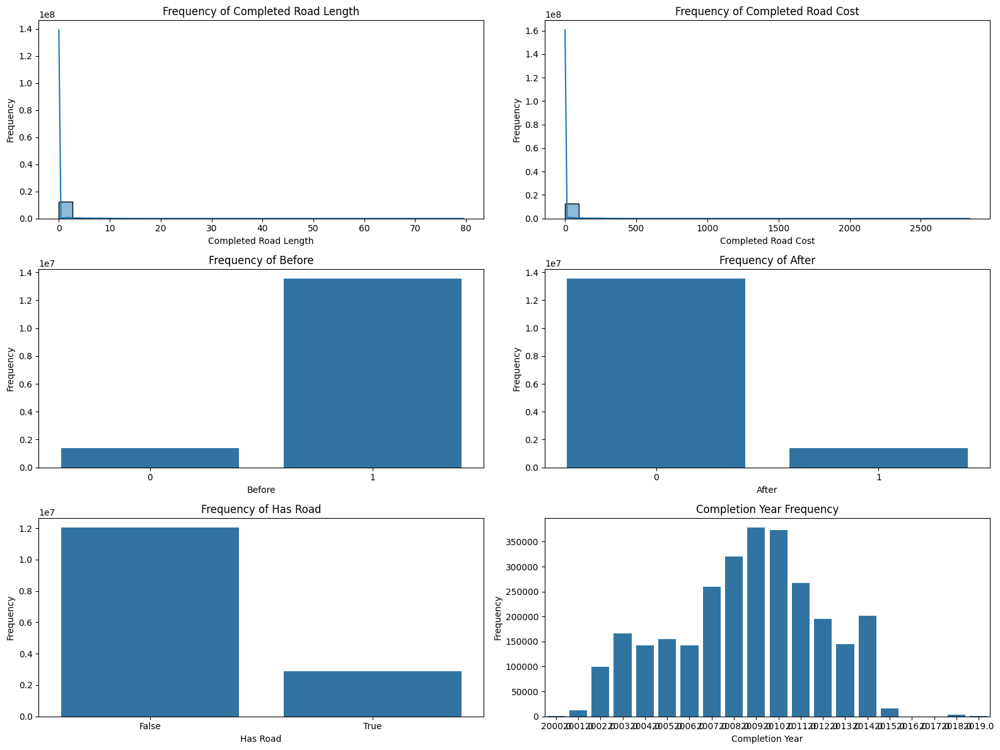

In [19]:
# Set up the matplotlib figure
plt.figure(figsize=(16, 12))

# Plotting frequency of completed_road_length
plt.subplot(3, 2, 1)
sns.histplot(df_transformed_all['completed_road_length'], bins=30, kde=True)
plt.title('Frequency of Completed Road Length')
plt.xlabel('Completed Road Length')
plt.ylabel('Frequency')

# Plotting frequency of completed_road_cost
plt.subplot(3, 2, 2)
sns.histplot(df_transformed_all['completed_road_cost'], bins=30, kde=True)
plt.title('Frequency of Completed Road Cost')
plt.xlabel('Completed Road Cost')
plt.ylabel('Frequency')

# Plotting frequency of before
plt.subplot(3, 2, 3)
sns.countplot(x='before', data=df_transformed_all)
plt.title('Frequency of Before')
plt.xlabel('Before')
plt.ylabel('Frequency')

# Plotting frequency of after
plt.subplot(3, 2, 4)
sns.countplot(x='after', data=df_transformed_all)
plt.title('Frequency of After')
plt.xlabel('After')
plt.ylabel('Frequency')

# Plotting frequency of has_road
plt.subplot(3, 2, 5)
sns.countplot(x='has_road', data=df_transformed_all)
plt.title('Frequency of Has Road')
plt.xlabel('Has Road')
plt.ylabel('Frequency')

# Plotting frequency of has_road
plt.subplot(3, 2, 6)
sns.countplot(x='first_completion_year', data=df_transformed_all)
plt.title('Completion Year Frequency')
plt.xlabel('Completion Year')
plt.ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

In [20]:
df_transformed_all.describe()

,year,completed_road_length,completed_road_cost,before,after,first_completion_year
count,14912768.0,1.340711e+07,1.340711e+07,1.491277e+07,1.491277e+07,2.880176e+06
mean,2007.5,5.809918e-01,1.624651e+01,9.078296e-01,9.217041e-02,2.008592e+03
std,7.5,2.433673e+00,7.547725e+01,2.892664e-01,2.892664e-01,3.300959e+00
min,1995.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+03
25%,2001.0,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,2.007000e+03
50%,2007.5,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,2.009000e+03
75%,2014.0,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,2.011000e+03
max,2020.0,7.950000e+01,2.842690e+03,1.000000e+00,1.000000e+00,2.019000e+03


In [73]:
# Merge the dataframes on 'shrid'
df_merged = df_transformed_all.merge(df_long[['shrid', 'treatment']], on='shrid', how='left')

# Update the treatment column in df_transformed_all
df_transformed_all['treatment'] = df_merged['treatment']

# Display the updated dataframe
df_transformed_all.head()

,shrid,year,completed_road_length,completed_road_cost,before,after,treatment
0,11-01-001-00001-000002,1995,NaN,NaN,1,0,1
1,11-01-001-00001-000002,1996,NaN,NaN,1,0,1
2,11-01-001-00001-000002,1997,NaN,NaN,1,0,1
3,11-01-001-00001-000002,1998,NaN,NaN,1,0,1
4,11-01-001-00001-000002,1999,NaN,NaN,1,0,1


In [74]:
df_transformed_all

,shrid,year,completed_road_length,completed_road_cost,before,after,treatment
0,11-01-001-00001-000002,1995,NaN,NaN,1,0,1
1,11-01-001-00001-000002,1996,NaN,NaN,1,0,1
2,11-01-001-00001-000002,1997,NaN,NaN,1,0,1
3,11-01-001-00001-000002,1998,NaN,NaN,1,0,1
4,11-01-001-00001-000002,1999,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...
14912763,11-35-640-05924-645570,2016,0.0,0.0,1,0,0
14912764,11-35-640-05924-645570,2017,0.0,0.0,1,0,0
14912765,11-35-640-05924-645570,2018,0.0,0.0,1,0,0
14912766,11-35-640-05924-645570,2019,0.0,0.0,1,0,0


In [21]:
# Replace NaN with 0 in the specified columns
df_transformed_all['completed_road_length'] = df_transformed_all['completed_road_length'].fillna(0)
df_transformed_all['completed_road_cost'] = df_transformed_all['completed_road_cost'].fillna(0)


In [22]:
df_transformed_all

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road
0,01-03-01-0002-00008200,1995,0.0,0.0,1,0,NaN,False
1,01-03-01-0002-00008200,1996,0.0,0.0,1,0,NaN,False
2,01-03-01-0002-00008200,1997,0.0,0.0,1,0,NaN,False
3,01-03-01-0002-00008200,1998,0.0,0.0,1,0,NaN,False
4,01-03-01-0002-00008200,1999,0.0,0.0,1,0,NaN,False
...,...,...,...,...,...,...,...,...
14912763,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False
14912764,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False
14912765,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False
14912766,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False


In [23]:
# Alternatively, use a raw string literal
file_path = r'C:\Users\Burhan\Documents\CASA_Dissertation\code\data\extracted_csv\df_transformed_all_has_road.csv'

# Save the dataframe to a CSV file
df_transformed_all.to_csv(file_path, index=False)

In [7]:
# Define the file path to your CSV file
file_path = r'C:\Users\Burhan\Documents\CASA_Dissertation\code\data\extracted_csv\df_transformed_all_has_road.csv'

# Load the dataset into a dataframe
df_transformed_csv = pd.read_csv(file_path)

In [8]:
df_transformed_csv
#checking whether all rows are in the dataframe

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road
0,01-03-01-0002-00008200,1995,0.0,0.0,1,0,NaN,False
1,01-03-01-0002-00008200,1996,0.0,0.0,1,0,NaN,False
2,01-03-01-0002-00008200,1997,0.0,0.0,1,0,NaN,False
3,01-03-01-0002-00008200,1998,0.0,0.0,1,0,NaN,False
4,01-03-01-0002-00008200,1999,0.0,0.0,1,0,NaN,False
...,...,...,...,...,...,...,...,...
14912763,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False
14912764,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False
14912765,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False
14912766,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False


In [1]:
# Path to the zip file
zip_file_path = 'C:/Users/Burhan/Downloads/night_lights_gee.zip'

# Initialize an empty dataframe
cumulative_harmonized_nightlight_df = pd.DataFrame()

# Open the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Iterate over each file in the zip file
    for file_name in zip_ref.namelist():
        if file_name.endswith('.csv'):
            with zip_ref.open(file_name) as file:
                temp_df = pd.read_csv(file)
                cumulative_harmonized_nightlight_df  = pd.concat([cumulative_harmonized_nightlight_df , temp_df], ignore_index=True)


In [2]:
# Display the cumulative dataframe
cumulative_harmonized_nightlight_df.describe()


,year,mean
count,14979978.0,1.497975e+07
mean,2007.5,5.892453e+00
std,7.5,7.020517e+00
min,1995.0,0.000000e+00
25%,2001.0,0.000000e+00
50%,2007.5,4.782051e+00
75%,2014.0,8.007026e+00
max,2020.0,6.300000e+01


In [3]:
# Renaming the columns for ease of identification
cumulative_harmonized_nightlight_df = cumulative_harmonized_nightlight_df.rename(columns={
    'shrid2': 'shrid',
    'year': 'night_light_year',
    'mean': 'night_light_value'
})

# Display the renamed dataframe
cumulative_harmonized_nightlight_df.head()

,shrid,night_light_year,night_light_value
0,11-14-275-01875-269903,2020,7.013978
1,11-15-287-01916-271664,2020,0.385239
2,11-18-300-02001-279696,2020,9.391048
3,11-18-302-02014-282052,2020,8.814329
4,11-18-302-02014-282097,2020,9.798100


In [4]:
cumulative_harmonized_nightlight_df

,shrid,night_light_year,night_light_value
0,11-14-275-01875-269903,2020,7.013978
1,11-15-287-01916-271664,2020,0.385239
2,11-18-300-02001-279696,2020,9.391048
3,11-18-302-02014-282052,2020,8.814329
4,11-18-302-02014-282097,2020,9.798100
...,...,...,...
14979973,11-27-523-04225-560061,2015,7.000000
14979974,11-28-533-04370-802905,2015,21.420263
14979975,11-29-558-05457-600249,2015,10.106588
14979976,11-27-517-04168-552985,2015,55.480096


In [30]:
# Check the number of NaN values per column
nan_counts_har_night = cumulative_harmonized_nightlight_df.isna().sum()

In [31]:
nan_counts_har_night

shrid                  0
night_light_year       0
night_light_value    231
dtype: int64

In [5]:
# Replace NaN with 0 in the specified columns
cumulative_harmonized_nightlight_df['night_light_value'] = cumulative_harmonized_nightlight_df['night_light_value'].fillna(0)

In [33]:
# Check the number of NaN values per column
nan_counts_har_night = cumulative_harmonized_nightlight_df.isna().sum()

In [34]:
nan_counts_har_night

shrid                0
night_light_year     0
night_light_value    0
dtype: int64

In [6]:
cumulative_harmonized_nightlight_df

,shrid,night_light_year,night_light_value
0,11-14-275-01875-269903,2020,7.013978
1,11-15-287-01916-271664,2020,0.385239
2,11-18-300-02001-279696,2020,9.391048
3,11-18-302-02014-282052,2020,8.814329
4,11-18-302-02014-282097,2020,9.798100
...,...,...,...
14979973,11-27-523-04225-560061,2015,7.000000
14979974,11-28-533-04370-802905,2015,21.420263
14979975,11-29-558-05457-600249,2015,10.106588
14979976,11-27-517-04168-552985,2015,55.480096


In [36]:
# Before the merge
original_size = df_transformed_csv.shape[0]

In [9]:
# Step 1: Merge night_light_value into df_transformed_csv
df_transformed_csv = pd.merge(df_transformed_csv, cumulative_harmonized_nightlight_df, 
                              left_on=['shrid', 'year'], 
                              right_on=['shrid', 'night_light_year'], 
                              how='left')

# Rearranging columns 
#df_transformed_csv = df_transformed_csv[['shrid', 'year', 'completed_road_length', 'completed_road_cost', 'night_light_value', 'before', 'during', 'after']]


In [10]:
df_transformed_csv

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road,night_light_year,night_light_value
0,01-03-01-0002-00008200,1995,0.0,0.0,1,0,NaN,False,NaN,NaN
1,01-03-01-0002-00008200,1996,0.0,0.0,1,0,NaN,False,NaN,NaN
2,01-03-01-0002-00008200,1997,0.0,0.0,1,0,NaN,False,NaN,NaN
3,01-03-01-0002-00008200,1998,0.0,0.0,1,0,NaN,False,NaN,NaN
4,01-03-01-0002-00008200,1999,0.0,0.0,1,0,NaN,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
14912763,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False,2016.0,3.499524
14912764,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False,2017.0,3.536485
14912765,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False,2018.0,3.526015
14912766,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False,2019.0,3.826459


In [40]:
# After the merge
merged_size = df_transformed_csv.shape[0]

In [41]:
print(f"Original size: {original_size}")
print(f"Merged size: {merged_size}")

Original size: 14912768
Merged size: 14912768


In [11]:
# Check the number of NaN values per column
nan_counts_df_transformed = df_transformed_csv.isna().sum()

In [12]:
nan_counts_df_transformed 

shrid                           0
year                            0
completed_road_length           0
completed_road_cost             0
before                          0
after                           0
first_completion_year    12032592
has_road                        0
night_light_year            49088
night_light_value           49088
dtype: int64

In [13]:
# Count non-NaN values in the 'night_light_value' column after the merge
matches_found = df_transformed_csv['night_light_value'].notna().sum()

print(f"Number of matches found: {matches_found}")
print(f"Total number of rows: {df_transformed_csv.shape[0]}")

match_percentage = (matches_found/df_transformed_csv.shape[0])*100

print(f"Match Percentage: {match_percentage}")

Number of matches found: 14863680
Total number of rows: 14912768
Match Percentage: 99.67083240348137


In [48]:
unique_shrids_with_nan = df_transformed_csv[df_transformed_csv['night_light_value'].isna()]['shrid'].unique()
print(f"Number of unique shrids with NaN values in night_light_value: {len(unique_shrids_with_nan)}")
print(unique_shrids_with_nan)


Number of unique shrids with NaN values in night_light_value: 1888
['01-03-01-0002-00008200' '01-03-01-0002-00008300'
 '01-03-01-0002-00009300' ... '11-29-559-05462-601031'
 '11-29-567-05512-606685' '11-33-617-05789-636649']


In [49]:
import pandas as pd

# Assuming df_transformed_csv is already loaded

# Filter shrids with NaN values in night_light_value
shrids_with_nan_night_light = df_transformed_csv[df_transformed_csv['night_light_value'].isna()]['shrid'].unique()

# Create a subset with these shrids
subset_nan_night_light = df_transformed_csv[df_transformed_csv['shrid'].isin(shrids_with_nan_night_light)]

# Check for NaN values in other columns in this subset
nan_counts_subset = subset_nan_night_light.isna().sum()

print("NaN counts in the subset of shrids with NaN in night_light_value:")
print(nan_counts_subset)

# Optionally, display the subset DataFrame to examine specific rows
print(subset_nan_night_light.head())


NaN counts in the subset of shrids with NaN in night_light_value:
shrid                        0
year                         0
completed_road_length        0
completed_road_cost          0
before                       0
after                        0
first_completion_year    47216
has_road                     0
night_light_year         49088
night_light_value        49088
dtype: int64
                    shrid  year  completed_road_length  completed_road_cost  \
0  01-03-01-0002-00008200  1995                    0.0                  0.0   
1  01-03-01-0002-00008200  1996                    0.0                  0.0   
2  01-03-01-0002-00008200  1997                    0.0                  0.0   
3  01-03-01-0002-00008200  1998                    0.0                  0.0   
4  01-03-01-0002-00008200  1999                    0.0                  0.0   

   before  after  first_completion_year  has_road  night_light_year  \
0       1      0                    NaN     False               N

In [14]:
import geopandas as gpd
shrid_geometry = gpd.read_file('C:/Users/Burhan/Documents/CASA_Dissertation/code/data/Shape_files/shrid_boundary_with_state_and_zone.shp')

In [15]:
shrid_geometry

,shrid,pc11_id,n,geometry_t,polysource,n_ncontig,maxdist_km,area_sq_km,state_name,zone,geometry
0,11-01-001-00001-000002,000002,1.0,Polygon,1 shrid = 1 pc polygon,NaN,NaN,5.120,Jammu and Kashmir,Northern,"POLYGON ((8233208.233 4116377.812, 8233324.196..."
1,11-01-001-00001-000005,000005,1.0,Polygon,1 shrid = 1 pc polygon,NaN,NaN,4.293,Jammu and Kashmir,Northern,"POLYGON ((8244124.529 4117283.264, 8244215.848..."
2,11-01-001-00001-000006,000006,1.0,Polygon,1 shrid = 1 pc polygon,NaN,NaN,4.380,Jammu and Kashmir,Northern,"POLYGON ((8246753.318 4114121.001, 8246861.191..."
3,11-01-001-00001-000007,000007,1.0,Polygon,1 shrid = 1 pc polygon,NaN,NaN,2.943,Jammu and Kashmir,Northern,"POLYGON ((8251296.932 4114208.475, 8251323.025..."
4,11-01-001-00001-000008,000008,1.0,Polygon,1 shrid = 1 pc polygon,NaN,NaN,2.392,Jammu and Kashmir,Northern,"POLYGON ((8253263.410 4119129.185, 8253528.159..."
...,...,...,...,...,...,...,...,...,...,...,...
576148,11-06-076-00378-059668,None,NaN,None,1 shrid = 1 manually picked polygon from far m...,2.0,14.344112,8.525,Haryana,Northern,"POLYGON ((8558950.535 3393812.318, 8559032.631..."
576149,11-06-076-00380-059773,None,NaN,None,1 shrid = 1 manually picked polygon from far m...,2.0,19.459710,7.461,Haryana,Northern,"POLYGON ((8540355.031 3389239.053, 8540428.149..."
576150,11-16-289-99999-801523,None,NaN,None,1 shrid = 1 manually picked polygon from far m...,5.0,37.378335,7.619,Tripura,North-Eastern,"POLYGON ((10156984.436 2736810.829, 10156865.3..."
576151,11-29-569-05523-608856,None,NaN,None,1 shrid = 1 manually picked polygon from far m...,2.0,32.652555,4.909,Karnataka,Southern,"POLYGON ((8321841.391 1486027.446, 8321875.081..."


In [17]:
#merging the state, zone and geometry to the night light data

# Select the columns to merge from shrid_geometry
shrid_geometry_subset = shrid_geometry[['shrid', 'state_name', 'zone','area_sq_km','geometry']]

# Merge the dataframes on the 'shrid' column
df_merged_final = df_transformed_csv.merge(shrid_geometry_subset, on='shrid', how='left')

# Display the merged dataframe
df_merged_final

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road,night_light_year,night_light_value,state_name,zone,area_sq_km,geometry
0,01-03-01-0002-00008200,1995,0.0,0.0,1,0,NaN,False,NaN,NaN,NaN,NaN,NaN,None
1,01-03-01-0002-00008200,1996,0.0,0.0,1,0,NaN,False,NaN,NaN,NaN,NaN,NaN,None
2,01-03-01-0002-00008200,1997,0.0,0.0,1,0,NaN,False,NaN,NaN,NaN,NaN,NaN,None
3,01-03-01-0002-00008200,1998,0.0,0.0,1,0,NaN,False,NaN,NaN,NaN,NaN,NaN,None
4,01-03-01-0002-00008200,1999,0.0,0.0,1,0,NaN,False,NaN,NaN,NaN,NaN,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14912763,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False,2016.0,3.499524,Andaman & Nicobar,Southern,20.791,"POLYGON ((10294826.537 1184603.131, 10293331.5..."
14912764,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False,2017.0,3.536485,Andaman & Nicobar,Southern,20.791,"POLYGON ((10294826.537 1184603.131, 10293331.5..."
14912765,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False,2018.0,3.526015,Andaman & Nicobar,Southern,20.791,"POLYGON ((10294826.537 1184603.131, 10293331.5..."
14912766,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False,2019.0,3.826459,Andaman & Nicobar,Southern,20.791,"POLYGON ((10294826.537 1184603.131, 10293331.5..."


In [18]:
# Check the number of NaN values per column
nan_counts_df_merged = df_merged_final.isna().sum()
nan_counts_df_merged

shrid                           0
year                            0
completed_road_length           0
completed_road_cost             0
before                          0
after                           0
first_completion_year    12032592
has_road                        0
night_light_year            49088
night_light_value           49088
state_name                  49088
zone                        50778
area_sq_km                  49088
geometry                    49088
dtype: int64

In [19]:
# Drop rows where any of the specified columns have NaN values
df_merged_final_cleaned = df_merged_final.dropna(subset=['geometry', 'night_light_value', 'state_name', 'zone'], how='any')

In [20]:
df_merged_final_cleaned

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road,night_light_year,night_light_value,state_name,zone,area_sq_km,geometry
41028,11-01-001-00001-000002,1995,0.0,0.0,1,0,2010.0,True,1995.0,0.000000,Jammu and Kashmir,Northern,5.120,"POLYGON ((8233208.233 4116377.812, 8233324.196..."
41029,11-01-001-00001-000002,1996,0.0,0.0,1,0,2010.0,True,1996.0,0.000000,Jammu and Kashmir,Northern,5.120,"POLYGON ((8233208.233 4116377.812, 8233324.196..."
41030,11-01-001-00001-000002,1997,0.0,0.0,1,0,2010.0,True,1997.0,0.000000,Jammu and Kashmir,Northern,5.120,"POLYGON ((8233208.233 4116377.812, 8233324.196..."
41031,11-01-001-00001-000002,1998,0.0,0.0,1,0,2010.0,True,1998.0,2.631749,Jammu and Kashmir,Northern,5.120,"POLYGON ((8233208.233 4116377.812, 8233324.196..."
41032,11-01-001-00001-000002,1999,0.0,0.0,1,0,2010.0,True,1999.0,0.000000,Jammu and Kashmir,Northern,5.120,"POLYGON ((8233208.233 4116377.812, 8233324.196..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14912763,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False,2016.0,3.499524,Andaman & Nicobar,Southern,20.791,"POLYGON ((10294826.537 1184603.131, 10293331.5..."
14912764,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False,2017.0,3.536485,Andaman & Nicobar,Southern,20.791,"POLYGON ((10294826.537 1184603.131, 10293331.5..."
14912765,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False,2018.0,3.526015,Andaman & Nicobar,Southern,20.791,"POLYGON ((10294826.537 1184603.131, 10293331.5..."
14912766,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False,2019.0,3.826459,Andaman & Nicobar,Southern,20.791,"POLYGON ((10294826.537 1184603.131, 10293331.5..."


In [21]:
# Check the number of NaN values per column
nan_counts_df_merged_final_cleaned = df_merged_final_cleaned.isna().sum()
nan_counts_df_merged_final_cleaned

shrid                           0
year                            0
completed_road_length           0
completed_road_cost             0
before                          0
after                           0
first_completion_year    11983686
has_road                        0
night_light_year                0
night_light_value               0
state_name                      0
zone                            0
area_sq_km                      0
geometry                        0
dtype: int64

In [22]:
# Define the file path
file_path = r'C:\Users\Burhan\Documents\CASA_Dissertation\code\data\extracted_csv\df_merged_final_has_road_clean_area.csv'

# Save the dataframe to a CSV file
df_merged_final_cleaned.to_csv(file_path, index=False)

In [23]:
import pandas as pd
import zipfile

# Path to the zip file
zip_file_path = 'C:/Users/Burhan/Downloads/shrug-rugged-dta.zip'
file_name = 'tri_shrid.dta'

# Initialize an empty dataframe
rugged_df = pd.DataFrame()

# Open the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the specified file
    with zip_ref.open(file_name) as file:
        # Read the .dta file into a pandas DataFrame
        rugged_df = pd.read_stata(file)

# Display the first few rows of the DataFrame
rugged_df

,shrid2,tri_min,tri_max,tri_mean,tri_median,tri_num_cells,tri_std
0,11-01-001-00001-000002,5.000000,152.754700,51.014035,49.779514,8321,18.382005
1,11-01-001-00001-000005,6.557438,208.007217,52.987109,51.312767,6623,17.070197
2,11-01-001-00001-000006,5.567764,145.694885,43.450931,42.485291,6594,13.656000
3,11-01-001-00001-000007,7.211102,171.764374,44.680424,43.982952,4156,13.538457
4,11-01-001-00001-000008,4.690416,186.978607,41.621157,40.533936,3444,15.337775
...,...,...,...,...,...,...,...
576450,11-35-640-05924-645566,0.000000,49.618546,8.160910,7.280110,7715,4.502170
576451,11-35-640-05924-645567,0.000000,36.932369,7.036725,6.164414,28658,3.775926
576452,11-35-640-05924-645568,0.000000,37.802116,7.195409,5.916080,10022,4.719837
576453,11-35-640-05924-645569,0.000000,75.980263,7.145720,5.567764,8544,5.516883


In [24]:
import pandas as pd
import zipfile

# Path to the zip file
zip_file_path = 'C:/Users/Burhan/Downloads/shrug-elevation-dta.zip'
file_name = 'elevation_shrid.dta'

# Initialize an empty dataframe
elevation_df = pd.DataFrame()

# Open the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the specified file
    with zip_ref.open(file_name) as file:
        # Read the .dta file into a pandas DataFrame
        elevation_df = pd.read_stata(file)

# Display the first few rows of the DataFrame
elevation_df

,shrid2,elevation_mean,elevation_median,elevation_percentile_5,elevation_percentile_25,elevation_min,elevation_max,elevation_num_cells,elevation_std
0,11-01-001-00001-000002,1758.410648,1745.0,1339.00,1585.00,1276.0,2406.0,8321,251.390562
1,11-01-001-00001-000005,2399.254718,2395.0,1944.10,2213.00,1823.0,3081.0,6623,268.828716
2,11-01-001-00001-000006,3176.797998,3206.0,2742.00,2953.00,2597.0,3651.0,6594,261.233354
3,11-01-001-00001-000007,2846.648941,2875.0,2484.75,2690.75,2363.0,3255.0,4156,203.604353
4,11-01-001-00001-000008,2825.052265,2830.0,2575.00,2714.00,2482.0,3123.0,3444,148.466248
...,...,...,...,...,...,...,...,...,...
576450,11-35-640-05924-645566,27.163448,25.0,9.00,19.00,0.0,69.0,7715,12.523217
576451,11-35-640-05924-645567,126.060891,134.0,57.00,116.00,28.0,175.0,28658,27.959493
576452,11-35-640-05924-645568,43.306925,32.0,8.00,21.00,0.0,120.0,10022,30.359780
576453,11-35-640-05924-645569,21.714302,18.0,6.00,9.00,0.0,89.0,8544,17.364967


In [25]:
# Merging the dataframes
terrain_df = pd.merge(rugged_df, elevation_df, on='shrid2')[['shrid2', 'elevation_min', 'elevation_max', 'elevation_mean', 'tri_min', 'tri_max', 'tri_mean']]

# Renaming column 'shrid2' to 'shrid'
terrain_df.rename(columns={'shrid2': 'shrid'}, inplace=True)

# Display the merged dataframe
terrain_df

,shrid,elevation_min,elevation_max,elevation_mean,tri_min,tri_max,tri_mean
0,11-01-001-00001-000002,1276.0,2406.0,1758.410648,5.000000,152.754700,51.014035
1,11-01-001-00001-000005,1823.0,3081.0,2399.254718,6.557438,208.007217,52.987109
2,11-01-001-00001-000006,2597.0,3651.0,3176.797998,5.567764,145.694885,43.450931
3,11-01-001-00001-000007,2363.0,3255.0,2846.648941,7.211102,171.764374,44.680424
4,11-01-001-00001-000008,2482.0,3123.0,2825.052265,4.690416,186.978607,41.621157
...,...,...,...,...,...,...,...
576450,11-35-640-05924-645566,0.0,69.0,27.163448,0.000000,49.618546,8.160910
576451,11-35-640-05924-645567,28.0,175.0,126.060891,0.000000,36.932369,7.036725
576452,11-35-640-05924-645568,0.0,120.0,43.306925,0.000000,37.802116,7.195409
576453,11-35-640-05924-645569,0.0,89.0,21.714302,0.000000,75.980263,7.145720


In [26]:
import pandas as pd
# Define the file path to your CSV file
file_path = r'C:\Users\Burhan\Documents\CASA_Dissertation\code\data\extracted_csv\df_merged_final_has_road_clean_area.csv'

# Load the dataset into a dataframe
df_merged_final_csv = pd.read_csv(file_path)

In [27]:
df_merged_final_csv

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road,night_light_year,night_light_value,state_name,zone,area_sq_km,geometry
0,11-01-001-00001-000002,1995,0.0,0.0,1,0,2010.0,True,1995.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...
1,11-01-001-00001-000002,1996,0.0,0.0,1,0,2010.0,True,1996.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...
2,11-01-001-00001-000002,1997,0.0,0.0,1,0,2010.0,True,1997.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...
3,11-01-001-00001-000002,1998,0.0,0.0,1,0,2010.0,True,1998.0,2.631749,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...
4,11-01-001-00001-000002,1999,0.0,0.0,1,0,2010.0,True,1999.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14861985,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False,2016.0,3.499524,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...
14861986,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False,2017.0,3.536485,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...
14861987,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False,2018.0,3.526015,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...
14861988,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False,2019.0,3.826459,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...


In [28]:
# Ensure both shrid columns are of the same type
terrain_df['shrid'] = terrain_df['shrid'].astype(str)

df_merged_final_csv['shrid'] = df_merged_final_csv['shrid'].astype(str)

In [29]:
# Merge terrain_df with df_merged_final_csv
final_df = pd.merge(df_merged_final_csv, terrain_df, on='shrid', how='left')

# Display the merged dataframe
final_df

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road,night_light_year,night_light_value,state_name,zone,area_sq_km,geometry,elevation_min,elevation_max,elevation_mean,tri_min,tri_max,tri_mean
0,11-01-001-00001-000002,1995,0.0,0.0,1,0,2010.0,True,1995.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
1,11-01-001-00001-000002,1996,0.0,0.0,1,0,2010.0,True,1996.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
2,11-01-001-00001-000002,1997,0.0,0.0,1,0,2010.0,True,1997.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
3,11-01-001-00001-000002,1998,0.0,0.0,1,0,2010.0,True,1998.0,2.631749,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
4,11-01-001-00001-000002,1999,0.0,0.0,1,0,2010.0,True,1999.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14861985,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False,2016.0,3.499524,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...,20.0,164.0,115.598222,0.0,42.284748,5.840916
14861986,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False,2017.0,3.536485,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...,20.0,164.0,115.598222,0.0,42.284748,5.840916
14861987,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False,2018.0,3.526015,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...,20.0,164.0,115.598222,0.0,42.284748,5.840916
14861988,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False,2019.0,3.826459,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...,20.0,164.0,115.598222,0.0,42.284748,5.840916


In [30]:
# Check the number of NaN values per column
nan_counts_0 = final_df.isna().sum()

In [31]:
nan_counts_0

shrid                           0
year                            0
completed_road_length           0
completed_road_cost             0
before                          0
after                           0
first_completion_year    11983686
has_road                        0
night_light_year                0
night_light_value               0
state_name                      0
zone                            0
area_sq_km                      0
geometry                        0
elevation_min                1196
elevation_max                1196
elevation_mean               1196
tri_min                      1196
tri_max                      1196
tri_mean                     1196
dtype: int64

In [10]:
missing_shrid = final_df[final_df[['elevation_min', 'elevation_max', 'elevation_mean', 'tri_min', 'tri_max', 'tri_mean']].isna().any(axis=1)]['shrid']
missing_shrid_list = missing_shrid.unique()

# Display missing shrid values
print("Missing shrid values:")
print(missing_shrid_list)

Missing shrid values:
['11-12-255-01700-265036' '11-12-260-01736-266696'
 '11-13-266-01811-267882' '11-13-266-01811-267883'
 '11-14-272-01863-268974' '11-18-314-02089-296057'
 '11-18-314-02090-297475' '11-19-339-02365-327558'
 '11-20-362-02669-370545' '11-21-395-03164-423327'
 '11-21-395-03165-423639' '11-28-544-04849-585160'
 '11-28-544-04849-585372' '11-28-544-04850-585543'
 '11-28-544-04850-585544' '11-31-587-05622-627032'
 '11-31-587-05623-627033' '11-31-587-05624-627034'
 '11-31-587-05627-627046' '11-33-618-05802-637822'
 '11-33-622-05829-639990' '11-35-638-05917-645091'
 '11-35-638-05917-645102' '11-35-638-05918-645140'
 '11-35-638-05918-645143' '11-35-638-05918-645150'
 '11-35-638-05918-645153' '11-35-638-05918-645158'
 '11-35-638-05918-645165' '11-35-638-05918-645172'
 '11-35-638-05918-645176' '11-35-638-05918-645183'
 '11-35-638-05918-645188' '11-35-638-05918-645189'
 '11-35-638-05918-645191' '11-35-638-05918-645192'
 '11-35-638-05918-645193' '11-35-638-05918-645194'
 '11-35-6

In [32]:
final_df_cleaned = final_df.dropna(subset=['elevation_min', 'elevation_max', 'elevation_mean', 'tri_min', 'tri_max', 'tri_mean'])

In [33]:
final_df_cleaned

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road,night_light_year,night_light_value,state_name,zone,area_sq_km,geometry,elevation_min,elevation_max,elevation_mean,tri_min,tri_max,tri_mean
0,11-01-001-00001-000002,1995,0.0,0.0,1,0,2010.0,True,1995.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
1,11-01-001-00001-000002,1996,0.0,0.0,1,0,2010.0,True,1996.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
2,11-01-001-00001-000002,1997,0.0,0.0,1,0,2010.0,True,1997.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
3,11-01-001-00001-000002,1998,0.0,0.0,1,0,2010.0,True,1998.0,2.631749,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
4,11-01-001-00001-000002,1999,0.0,0.0,1,0,2010.0,True,1999.0,0.000000,Jammu and Kashmir,Northern,5.120,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.754700,51.014035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14861985,11-35-640-05924-645570,2016,0.0,0.0,1,0,NaN,False,2016.0,3.499524,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...,20.0,164.0,115.598222,0.0,42.284748,5.840916
14861986,11-35-640-05924-645570,2017,0.0,0.0,1,0,NaN,False,2017.0,3.536485,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...,20.0,164.0,115.598222,0.0,42.284748,5.840916
14861987,11-35-640-05924-645570,2018,0.0,0.0,1,0,NaN,False,2018.0,3.526015,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...,20.0,164.0,115.598222,0.0,42.284748,5.840916
14861988,11-35-640-05924-645570,2019,0.0,0.0,1,0,NaN,False,2019.0,3.826459,Andaman & Nicobar,Southern,20.791,POLYGON ((10294826.537393697 1184603.131206842...,20.0,164.0,115.598222,0.0,42.284748,5.840916


In [34]:
# Check the number of NaN values per column
nan_counts_1 = final_df_cleaned.isna().sum()

In [35]:
nan_counts_1

shrid                           0
year                            0
completed_road_length           0
completed_road_cost             0
before                          0
after                           0
first_completion_year    11982542
has_road                        0
night_light_year                0
night_light_value               0
state_name                      0
zone                            0
area_sq_km                      0
geometry                        0
elevation_min                   0
elevation_max                   0
elevation_mean                  0
tri_min                         0
tri_max                         0
tri_mean                        0
dtype: int64

In [36]:
# Define the file path
file_path = r'C:\Users\Burhan\Documents\CASA_Dissertation\code\data\extracted_csv\final_df_cleaned.csv'

# Save the dataframe to a CSV file
final_df_cleaned.to_csv(file_path, index=False)

In [1]:
import pandas as pd
# Define the file path to your CSV file
file_path = r'C:\Users\Burhan\Documents\CASA_Dissertation\code\data\extracted_csv\final_df_cleaned.csv'

# Load the dataset into a dataframe
final_df_cleaned_csv = pd.read_csv(file_path)

In [2]:
final_df_cleaned_csv.head()

,shrid,year,completed_road_length,completed_road_cost,before,after,first_completion_year,has_road,night_light_year,night_light_value,state_name,zone,area_sq_km,geometry,elevation_min,elevation_max,elevation_mean,tri_min,tri_max,tri_mean
0,11-01-001-00001-000002,1995,0.0,0.0,1,0,2010.0,True,1995.0,0.000000,Jammu and Kashmir,Northern,5.12,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.7547,51.014035
1,11-01-001-00001-000002,1996,0.0,0.0,1,0,2010.0,True,1996.0,0.000000,Jammu and Kashmir,Northern,5.12,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.7547,51.014035
2,11-01-001-00001-000002,1997,0.0,0.0,1,0,2010.0,True,1997.0,0.000000,Jammu and Kashmir,Northern,5.12,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.7547,51.014035
3,11-01-001-00001-000002,1998,0.0,0.0,1,0,2010.0,True,1998.0,2.631749,Jammu and Kashmir,Northern,5.12,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.7547,51.014035
4,11-01-001-00001-000002,1999,0.0,0.0,1,0,2010.0,True,1999.0,0.000000,Jammu and Kashmir,Northern,5.12,POLYGON ((8233208.232841291 4116377.8117456757...,1276.0,2406.0,1758.410648,5.0,152.7547,51.014035


In [2]:
final_df_cleaned_csv.describe()

,year,completed_road_length,completed_road_cost,before,after,first_completion_year,night_light_year,night_light_value,area_sq_km,elevation_min,elevation_max,elevation_mean,tri_min,tri_max,tri_mean
count,14860794.0,1.486079e+07,1.486079e+07,1.486079e+07,1.486079e+07,2.878252e+06,14860794.0,1.486079e+07,1.486079e+07,1.486079e+07,1.486079e+07,1.486079e+07,1.486079e+07,1.486079e+07,1.486079e+07
mean,2007.5,5.237804e-01,1.464859e+01,9.075731e-01,9.242689e-02,2.008592e+03,2007.5,5.767600e+00,4.544684e+00,2.956300e+02,3.827399e+02,3.317936e+02,6.408139e-01,2.681175e+01,7.074477e+00
std,7.5,2.317421e+00,7.184088e+01,2.896276e-01,2.896276e-01,3.301057e+00,7.5,6.769577e+00,1.160468e+01,3.418060e+02,4.724838e+02,3.976757e+02,1.791266e+00,3.631736e+01,8.646101e+00
min,1995.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+03,1995.0,0.000000e+00,1.000000e-03,-8.300000e+01,0.000000e+00,-2.509528e+01,0.000000e+00,0.000000e+00,0.000000e+00
25%,2001.0,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,2.007000e+03,2001.0,0.000000e+00,1.141000e+00,7.600000e+01,9.700000e+01,8.514822e+01,0.000000e+00,1.000000e+01,3.249475e+00
50%,2007.5,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,2.009000e+03,2007.5,4.724372e+00,2.414000e+00,1.880000e+02,2.350000e+02,2.074140e+02,0.000000e+00,1.431782e+01,3.953765e+00
75%,2014.0,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,2.011000e+03,2014.0,8.000000e+00,5.075000e+00,3.990000e+02,4.880000e+02,4.327880e+02,1.000000e+00,2.971532e+01,5.680133e+00
max,2020.0,7.950000e+01,2.842690e+03,1.000000e+00,1.000000e+00,2.019000e+03,2020.0,6.300000e+01,1.993116e+03,5.007000e+03,7.626000e+03,5.707803e+03,3.117691e+01,3.787093e+03,7.965838e+01


In [ ]:
# Just checking the statistics with respect to one of the states as the dataset is huge.

In [4]:
# Filter the DataFrame to include only rows where state_name is 'Madhya Pradesh'
df_mp = final_df_cleaned_csv [final_df_cleaned_csv ['state_name'] == 'Madhya Pradesh']

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\1949551056.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_state['relative_year'] = df_state['year'] - df_state['first_completion_year']


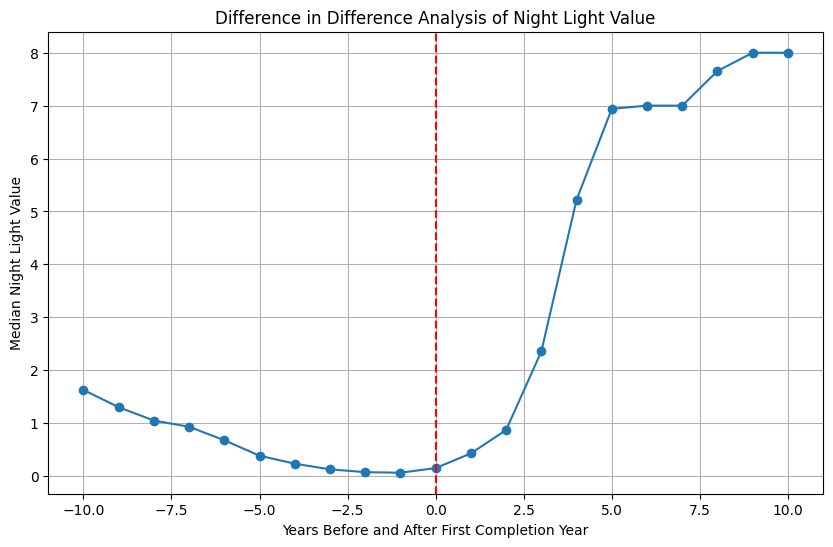

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Filter the DataFrame to include only rows where state_name is 'Madhya Pradesh'
df_state = final_df_cleaned_csv [final_df_cleaned_csv ['state_name'] == 'Madhya Pradesh']

# Calculate the relative year with respect to first_completion_year
df_state['relative_year'] = df_state['year'] - df_state['first_completion_year']

# Filter the data for shrids that have has_road = True
filtered_df = df_state[df_state['has_road']]

# Define the range for analysis (e.g., -10 to +10 years around first_completion_year)
range_years = 10

# Filter the dataframe to include only the years within the specified range
filtered_df = filtered_df[(filtered_df['relative_year'] >= -range_years) & (filtered_df['relative_year'] <= range_years)]

# Group by relative_year and calculate the median night_light_value
median_night_light = filtered_df.groupby('relative_year')['night_light_value'].median().reset_index()

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(median_night_light['relative_year'], median_night_light['night_light_value'], marker='o')
plt.axvline(x=0, color='r', linestyle='--')
plt.xlabel('Years Before and After First Completion Year')
plt.ylabel('Median Night Light Value')
plt.title('Difference in Difference Analysis of Night Light Value')
plt.grid(True)
plt.show()


C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2125778330.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_zone['relative_year'] = df_zone['year'] - df_zone['first_completion_year']


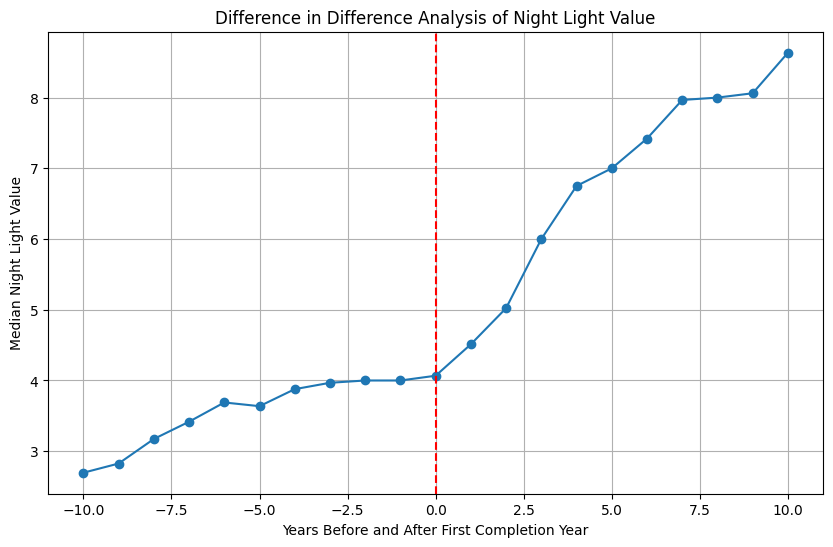

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Filter the DataFrame to include only rows where zone is 'Northern'
df_zone = final_df_cleaned_csv [final_df_cleaned_csv ['zone'] == 'Northern']

# Calculate the relative year with respect to first_completion_year
df_zone['relative_year'] = df_zone['year'] - df_zone['first_completion_year']

# Filter the data for shrids that have has_road = True
filtered_df = df_zone[df_zone['has_road']]

# Define the range for analysis (e.g., -10 to +10 years around first_completion_year)
range_years = 10

# Filter the dataframe to include only the years within the specified range
filtered_df = filtered_df[(filtered_df['relative_year'] >= -range_years) & (filtered_df['relative_year'] <= range_years)]

# Group by relative_year and calculate the median night_light_value
median_night_light = filtered_df.groupby('relative_year')['night_light_value'].median().reset_index()

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(median_night_light['relative_year'], median_night_light['night_light_value'], marker='o')
plt.axvline(x=0, color='r', linestyle='--')
plt.xlabel('Years Before and After First Completion Year')
plt.ylabel('Median Night Light Value')
plt.title('Difference in Difference Analysis of Night Light Value')
plt.grid(True)
plt.show()

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2283848285.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


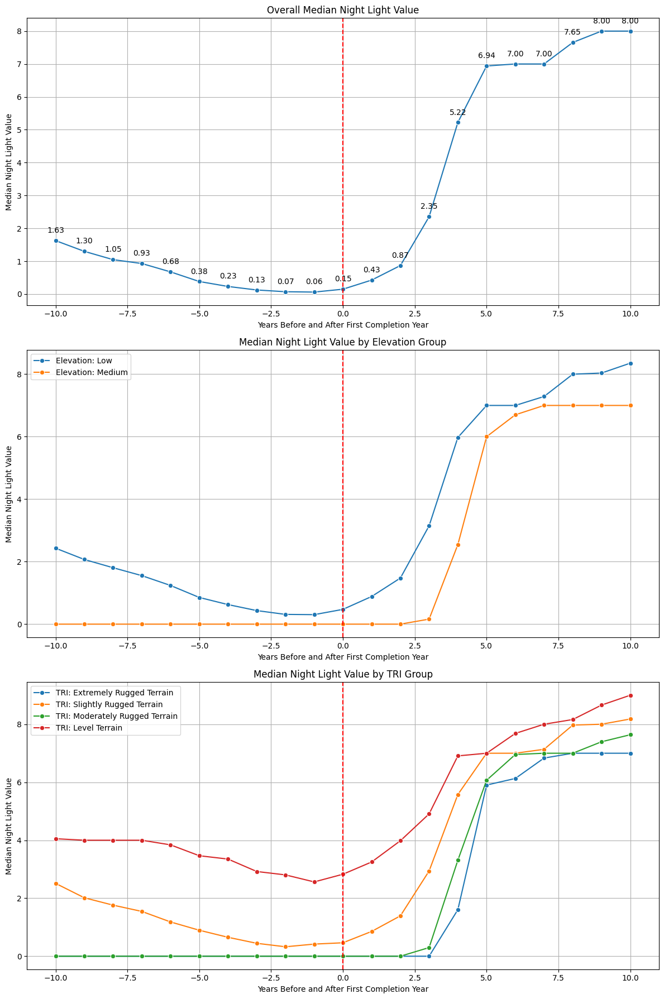

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2283848285.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


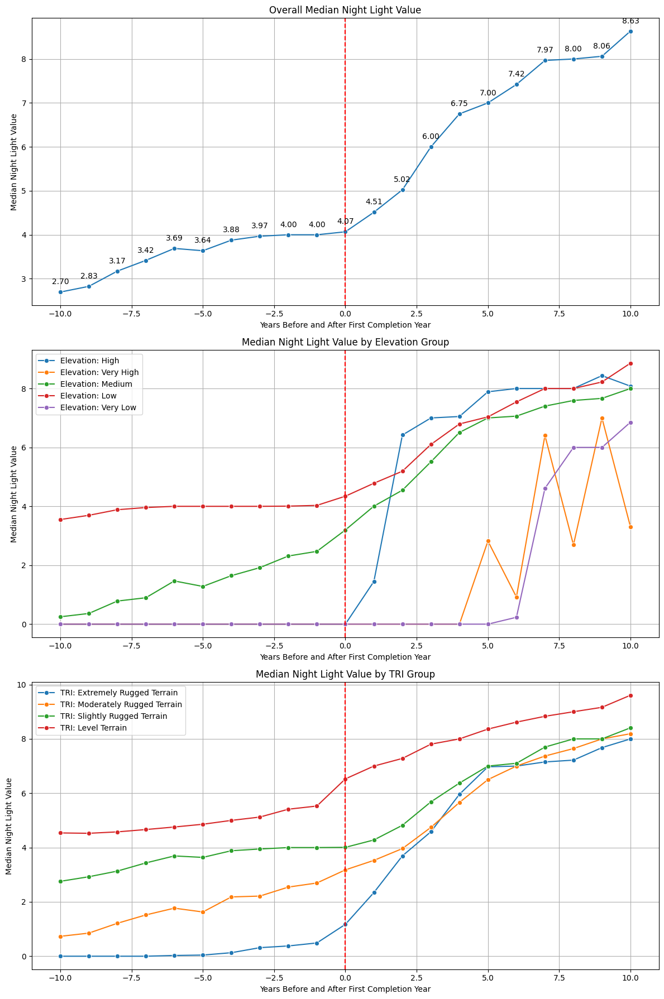

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def filter_data(df, state_name=None, zone=None, range_years=10):
    # Filter the DataFrame based on state_name and zone if provided
    if state_name:
        df = df[df['state_name'] == state_name]
    if zone:
        df = df[df['zone'] == zone]
    
    # Calculate the relative year with respect to first_completion_year
    df['relative_year'] = df['year'] - df['first_completion_year']
    
    # Filter the data for shrids that have has_road = True
    filtered_df = df[df['has_road']]
    
    # Filter the dataframe to include only the years within the specified range
    filtered_df = filtered_df[(filtered_df['relative_year'] >= -range_years) & (filtered_df['relative_year'] <= range_years)]
    
    # Define elevation ranges manually
    elevation_bins = [0, 100, 500, 1500, 3000, np.inf]
    elevation_labels = ["Very Low", "Low", "Medium", "High", "Very High"]
    filtered_df['elevation_group'] = pd.cut(filtered_df['elevation_mean'], bins=elevation_bins, labels=elevation_labels, right=False)
    
    # Define TRI ranges based on the provided statistics
    tri_bins = [0, 3.25, 5.68, 7.97, np.inf]
    tri_labels = ["Level Terrain", "Slightly Rugged Terrain", "Moderately Rugged Terrain", "Extremely Rugged Terrain"]
    filtered_df['tri_group'] = pd.cut(filtered_df['tri_mean'], bins=tri_bins, labels=tri_labels, right=False)
    
    return filtered_df

def plot_median_night_light(df, range_years=10, state_name=None, zone_name=None):
    fig, axs = plt.subplots(3, 1, figsize=(12, 18))
    
    # Overall Median Plot
    median_night_light = df.groupby('relative_year')['night_light_value'].median().reset_index()
    sns.lineplot(x='relative_year', y='night_light_value', data=median_night_light, marker='o', ax=axs[0])
    axs[0].axvline(x=0, color='r', linestyle='--')
    axs[0].set_title('Overall Median Night Light Value')
    axs[0].set_xlabel('Years Before and After First Completion Year')
    axs[0].set_ylabel('Median Night Light Value')
    axs[0].grid(True)

    for i, row in median_night_light.iterrows():
        axs[0].annotate(f"{row['night_light_value']:.2f}", (row['relative_year'], row['night_light_value']),
                        textcoords="offset points", xytext=(0, 10), ha='center')
    
    # Elevation Group Plot
    for group in df['elevation_group'].unique():
        if pd.notna(group):
            group_data = df[df['elevation_group'] == group].groupby('relative_year')['night_light_value'].median().reset_index()
            sns.lineplot(x='relative_year', y='night_light_value', data=group_data, marker='o', label=f'Elevation: {group}', ax=axs[1])
    axs[1].axvline(x=0, color='r', linestyle='--')
    axs[1].set_title('Median Night Light Value by Elevation Group')
        # Set the plot title with state_name or zone_name
    title = 'Median Night Light Value by Elevation Group'
    if state_name:
        title += f" for {state_name}"
    if zone_name:
        title += f" in {zone_name} Zone"
    title += f" ({-range_years} to {range_years} Years)"
    axs[1].set_xlabel('Years Before and After First Completion Year')
    axs[1].set_ylabel('Median Night Light Value')
    axs[1].legend()
    axs[1].grid(True)
    
    # Terrain Group Plot
    for group in df['tri_group'].unique():
        if pd.notna(group):
            group_data = df[df['tri_group'] == group].groupby('relative_year')['night_light_value'].median().reset_index()
            sns.lineplot(x='relative_year', y='night_light_value', data=group_data, marker='o', label=f'TRI: {group}', ax=axs[2])
    axs[2].axvline(x=0, color='r', linestyle='--')
    axs[2].set_title('Median Night Light Value by TRI Group')
    axs[2].set_xlabel('Years Before and After First Completion Year')
    axs[2].set_ylabel('Median Night Light Value')
    axs[2].legend()
    axs[2].grid(True)
    
    plt.tight_layout()
    plt.show()

# Usage example
# final_df_cleaned_csv = pd.read_csv('your_data.csv')  # Replace with your actual data file

# Define range of years for analysis
range_years = 10

# Get data for a specific state
state_name = 'Madhya Pradesh'
filtered_df_state = filter_data(final_df_cleaned_csv, state_name=state_name, range_years=range_years)
plot_median_night_light(filtered_df_state, range_years=range_years, state_name=state_name)

# Optionally, get data for a specific zone
zone_name = 'Northern'
filtered_df_zone = filter_data(final_df_cleaned_csv, zone=zone_name, range_years=range_years)
plot_median_night_light(filtered_df_zone, range_years=range_years, zone_name=zone_name)


In [30]:
# Function for the Range Charts & Graphs

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def filter_data(df, state_name=None, zone=None, range_years=10):
    # Filter the DataFrame based on state_name and zone if provided
    if state_name:
        df = df[df['state_name'] == state_name]
    if zone:
        df = df[df['zone'] == zone]
    
    # Calculate the relative year with respect to first_completion_year
    df['relative_year'] = df['year'] - df['first_completion_year']
    
    # Filter the data for shrids that have has_road = True
    filtered_df = df[df['has_road']]
    
    # Filter the dataframe to include only the years within the specified range
    filtered_df = filtered_df[(filtered_df['relative_year'] >= -range_years) & (filtered_df['relative_year'] <= range_years)]
    
    # Define elevation ranges manually
    elevation_bins = [0, 100, 500, 1500, 3000, np.inf]
    elevation_labels = ["Very Low", "Low", "Medium", "High", "Very High"]
    filtered_df['elevation_group'] = pd.cut(filtered_df['elevation_mean'], bins=elevation_bins, labels=elevation_labels, right=False)
    
    # Define TRI ranges based on the provided statistics
    tri_bins = [0, 3.25, 5.68, 7.97, np.inf]
    tri_labels = ["Level Terrain", "Slightly Rugged Terrain", "Moderately Rugged Terrain", "Extremely Rugged Terrain"]
    filtered_df['tri_group'] = pd.cut(filtered_df['tri_mean'], bins=tri_bins, labels=tri_labels, right=False)
    
    return filtered_df

def plot_median_night_light(df, range_years=10, state_name=None, zone_name=None):
    fig, axs = plt.subplots(1, 2, figsize=(24, 6))
    
    # Define title base
    base_title = ""
    if state_name:
        base_title += f" for {state_name}"
    if zone_name:
        base_title += f" in {zone_name} Zone"
    base_title += f" ({-range_years} to {range_years} Years)"
    
    # Overall Median Plot
    median_night_light = df.groupby('relative_year')['night_light_value'].median().reset_index()
    sns.lineplot(x='relative_year', y='night_light_value', data=median_night_light, marker='o', ax=axs[0])
    axs[0].axvline(x=0, color='r', linestyle='--')
    axs[0].set_title('Overall Median Night Light Value' + base_title)
    axs[0].set_xlabel('Years Before and After First Completion Year')
    axs[0].set_ylabel('Median Night Light Value')
    axs[0].grid(True)

    for i, row in median_night_light.iterrows():
        axs[0].annotate(f"{row['night_light_value']:.2f}", (row['relative_year'], row['night_light_value']),
                        textcoords="offset points", xytext=(0, 10), ha='center')
    
    # Elevation Group Plot
    # for group in df['elevation_group'].unique():
    #     if pd.notna(group):
    #         group_data = df[df['elevation_group'] == group].groupby('relative_year')['night_light_value'].median().reset_index()
    #         sns.lineplot(x='relative_year', y='night_light_value', data=group_data, marker='o', label=f'Elevation: {group}', ax=axs[1])
    # axs[1].axvline(x=0, color='r', linestyle='--')
    # axs[1].set_title('Median Night Light Value by Elevation Group' + base_title)
    # axs[1].set_xlabel('Years Before and After First Completion Year')
    # axs[1].set_ylabel('Median Night Light Value')
    # axs[1].legend()
    # axs[1].grid(True)
    
    # Terrain Group Plot
    for group in df['tri_group'].unique():
        if pd.notna(group):
            group_data = df[df['tri_group'] == group].groupby('relative_year')['night_light_value'].median().reset_index()
            sns.lineplot(x='relative_year', y='night_light_value', data=group_data, marker='o', label=f'TRI: {group}', ax=axs[1])
    axs[1].axvline(x=0, color='r', linestyle='--')
    axs[1].set_title('Median Night Light Value by TRI Group' + base_title)
    axs[1].set_xlabel('Years Before and After First Completion Year')
    axs[1].set_ylabel('Median Night Light Value')
    axs[1].legend()
    axs[1].grid(True)
    
    plt.tight_layout()
    plt.show()

# Usage example
# final_df_cleaned_csv = pd.read_csv('your_data.csv')  # Replace with your actual data file

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2812983243.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


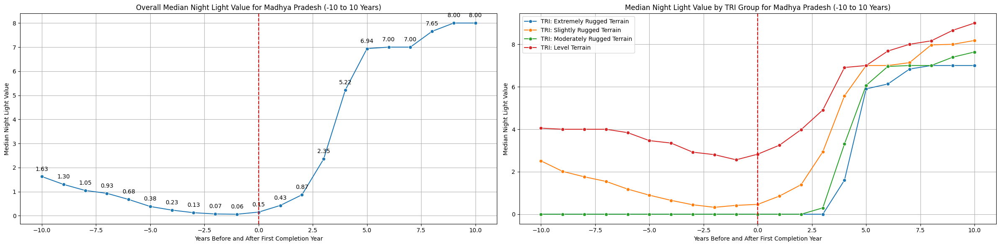

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2812983243.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


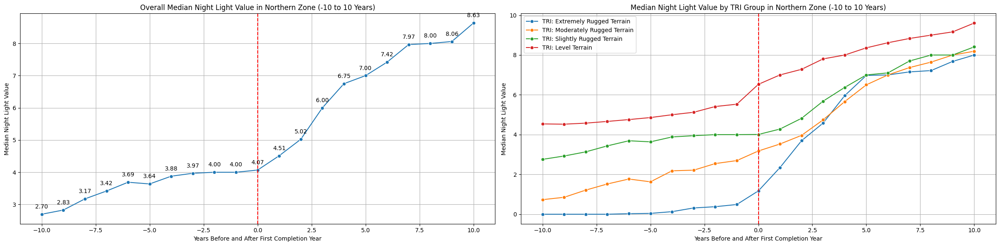

In [31]:
# Define range of years for analysis
range_years = 10

# Get data for a specific state
state_name = 'Madhya Pradesh'
filtered_df_state = filter_data(final_df_cleaned_csv, state_name=state_name, range_years=range_years)
plot_median_night_light(filtered_df_state, range_years=range_years, state_name=state_name)

# Optionally, get data for a specific zone
zone_name = 'Northern'
filtered_df_zone = filter_data(final_df_cleaned_csv, zone=zone_name, range_years=range_years)
plot_median_night_light(filtered_df_zone, range_years=range_years, zone_name=zone_name)


C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2812983243.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


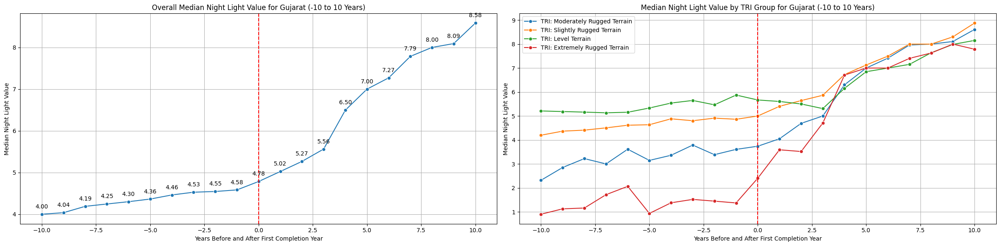

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2812983243.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


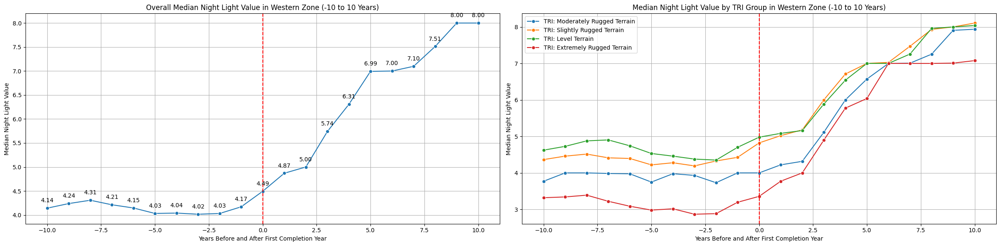

In [32]:
# Define range of years for analysis
range_years = 10

# Get data for a specific state
state_name = 'Gujarat'
filtered_df_state = filter_data(final_df_cleaned_csv, state_name=state_name, range_years=range_years)
plot_median_night_light(filtered_df_state, range_years=range_years, state_name=state_name)

# Optionally, get data for a specific zone
zone_name = 'Western'
filtered_df_zone = filter_data(final_df_cleaned_csv, zone=zone_name, range_years=range_years)
plot_median_night_light(filtered_df_zone, range_years=range_years, zone_name=zone_name)


C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2812983243.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


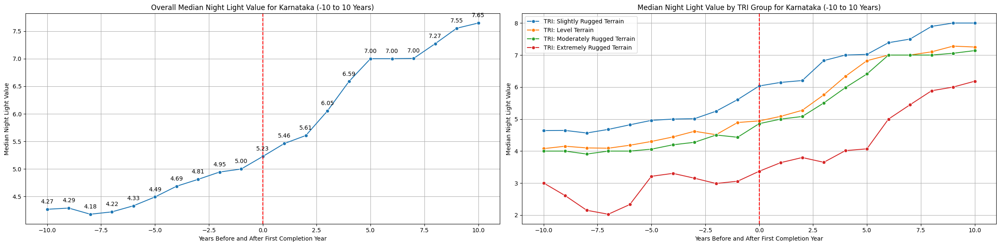

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2812983243.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


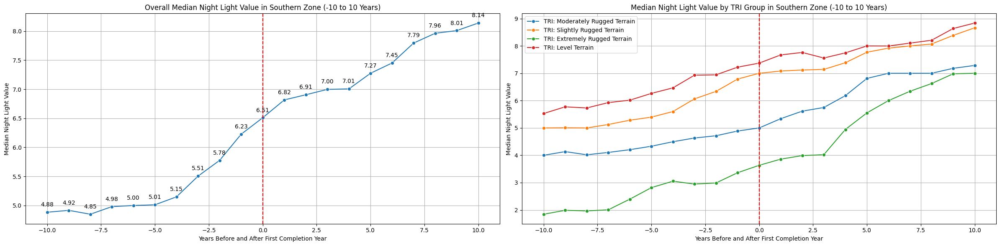

In [34]:
# Define range of years for analysis
range_years = 10

# Get data for a specific state
state_name = 'Karnataka'
filtered_df_state = filter_data(final_df_cleaned_csv, state_name=state_name, range_years=range_years)
plot_median_night_light(filtered_df_state, range_years=range_years, state_name=state_name)

# Optionally, get data for a specific zone
zone_name = 'Southern'
filtered_df_zone = filter_data(final_df_cleaned_csv, zone=zone_name, range_years=range_years)
plot_median_night_light(filtered_df_zone, range_years=range_years, zone_name=zone_name)

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2812983243.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


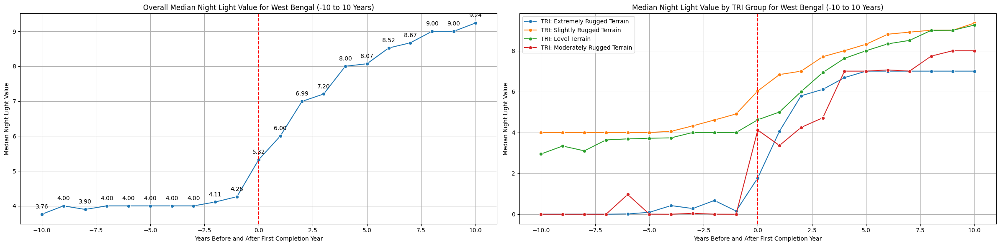

C:\Users\Burhan\AppData\Local\Temp\ipykernel_18728\2812983243.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['relative_year'] = df['year'] - df['first_completion_year']


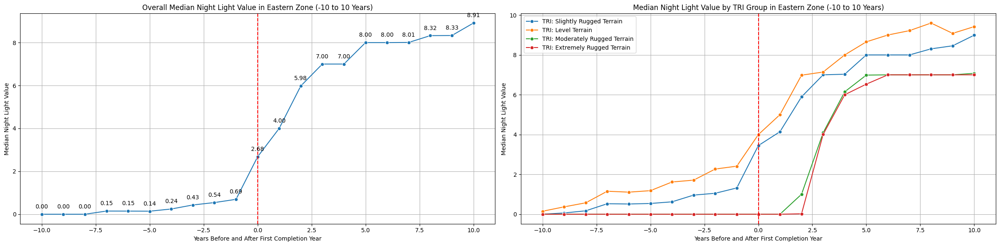

In [35]:
# Define range of years for analysis
range_years = 10

# Get data for a specific state
state_name = 'West Bengal'
filtered_df_state = filter_data(final_df_cleaned_csv, state_name=state_name, range_years=range_years)
plot_median_night_light(filtered_df_state, range_years=range_years, state_name=state_name)

# Optionally, get data for a specific zone
zone_name = 'Eastern'
filtered_df_zone = filter_data(final_df_cleaned_csv, zone=zone_name, range_years=range_years)
plot_median_night_light(filtered_df_zone, range_years=range_years, zone_name=zone_name)

Year: 1995, Number of entries: 50938, Mean night light value: 3.0456639423193015
Year: 1996, Number of entries: 50938, Mean night light value: 3.053671661955947
Year: 1997, Number of entries: 50938, Mean night light value: 2.2686857654874006
Year: 1998, Number of entries: 50938, Mean night light value: 3.038010771485077
Year: 1999, Number of entries: 50938, Mean night light value: 2.9534888444289757
Year: 2000, Number of entries: 50938, Mean night light value: 3.08652268259348
Year: 2001, Number of entries: 50938, Mean night light value: 2.4313407254980066
Year: 2002, Number of entries: 50938, Mean night light value: 2.4807526462276526
Year: 2003, Number of entries: 50938, Mean night light value: 1.8697902853374317
Year: 2004, Number of entries: 50938, Mean night light value: 2.5082832668461825
Year: 2005, Number of entries: 50938, Mean night light value: 2.291493593804947
Year: 2006, Number of entries: 50938, Mean night light value: 1.6270391311443244
Year: 2007, Number of entries: 50

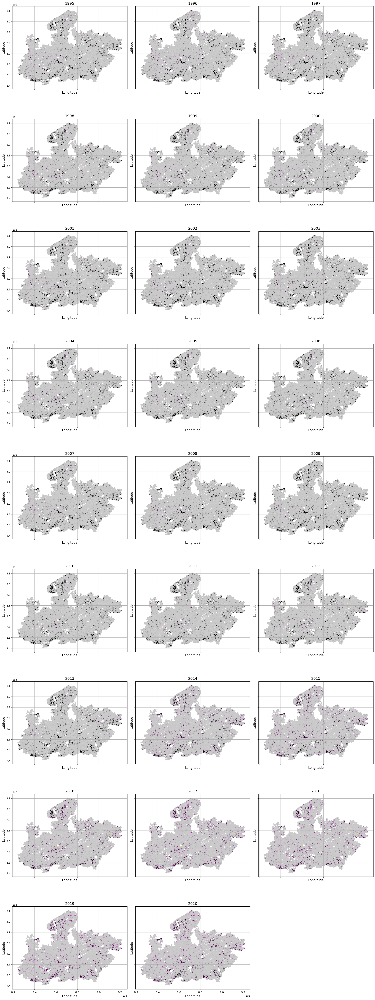

In [83]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# # Filter the DataFrame to include only rows where state_name is 'Madhya Pradesh'
# df_mp = df_merged_final_cleaned[df_merged_final_cleaned['state_name'] == 'Madhya Pradesh']

# # Convert to GeoDataFrame
# gdf_mp = gpd.GeoDataFrame(df_mp, geometry='geometry')

# # Ensure that the geometries are valid
# gdf_mp = gdf_mp[gdf_mp.is_valid]

# # Check and set the coordinate reference system (CRS) if necessary
# if gdf_mp.crs is None:
#     gdf_mp.crs = 'EPSG:4326'

# Create a custom colormap
colors = ['#000000', '#ff00ff', '#ffff00', '#ffffff']
n_bins = 100  # Defines the number of discrete color steps in the colormap
cmap_name = 'custom_night_light'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Function to plot the night light values for all years in a grid
def plot_night_light_all_years(gdf):
    years = gdf['year'].unique()
    years.sort()
    
    num_years = len(years)
    num_cols = 3
    num_rows = (num_years + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 6), sharex=True, sharey=True)
    axes = axes.flatten()
    
    for ax, year in zip(axes, years):
        gdf_year = gdf[gdf['year'] == year]
        
        # Debugging: Print some statistics about the current year's data
        print(f"Year: {year}, Number of entries: {len(gdf_year)}, Mean night light value: {gdf_year['night_light_value'].mean()}")
        
        gdf_year.plot(column='night_light_value', cmap=cm, linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)
        ax.set_title(f'{year}', fontsize=14)
        ax.set_xlabel('Longitude', fontsize=12)
        ax.set_ylabel('Latitude', fontsize=12)
        ax.grid(True)
    
    # Remove any empty subplots
    for i in range(num_years, len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

# Plotting the night light map for all years
plot_night_light_all_years(gdf_mp)

Text(0, 0.5, 'Frequency')

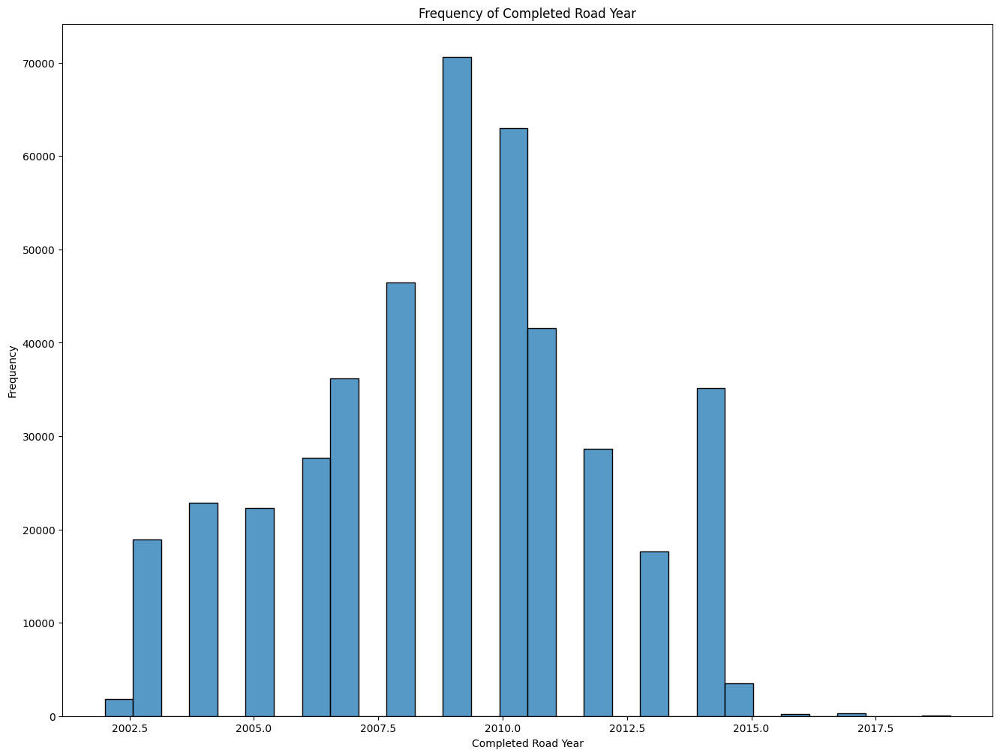

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the matplotlib figure
plt.figure(figsize=(16, 12))

sns.histplot(df_mp['first_completion_year'], bins=30, kde=False)
plt.title('Frequency of Completed Road Year')
plt.xlabel('Completed Road Year')
plt.ylabel('Frequency')

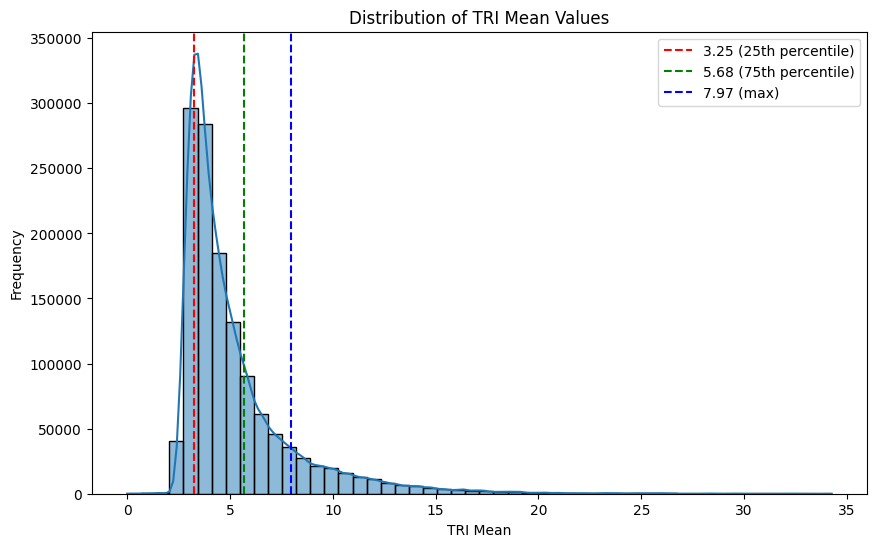

In [86]:
plt.figure(figsize=(10, 6))
sns.histplot(df_mp['tri_mean'], bins=50, kde=True)
plt.axvline(3.25, color='r', linestyle='--', label='3.25 (25th percentile)')
plt.axvline(5.68, color='g', linestyle='--', label='5.68 (75th percentile)')
plt.axvline(7.97, color='b', linestyle='--', label='7.97 (max)')
plt.legend()
plt.title('Distribution of TRI Mean Values')
plt.xlabel('TRI Mean')
plt.ylabel('Frequency')
plt.show()


C:\Users\Burhan\AppData\Local\Temp\ipykernel_2576\1192130359.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='elevation_description', y='total_road_length', data=agg_metrics, palette='Set3')
C:\Users\Burhan\AppData\Local\Temp\ipykernel_2576\1192130359.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='elevation_description', y='total_road_cost', data=agg_metrics, palette='Set3')
C:\Users\Burhan\AppData\Local\Temp\ipykernel_2576\1192130359.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='elevation_description', y='total_area

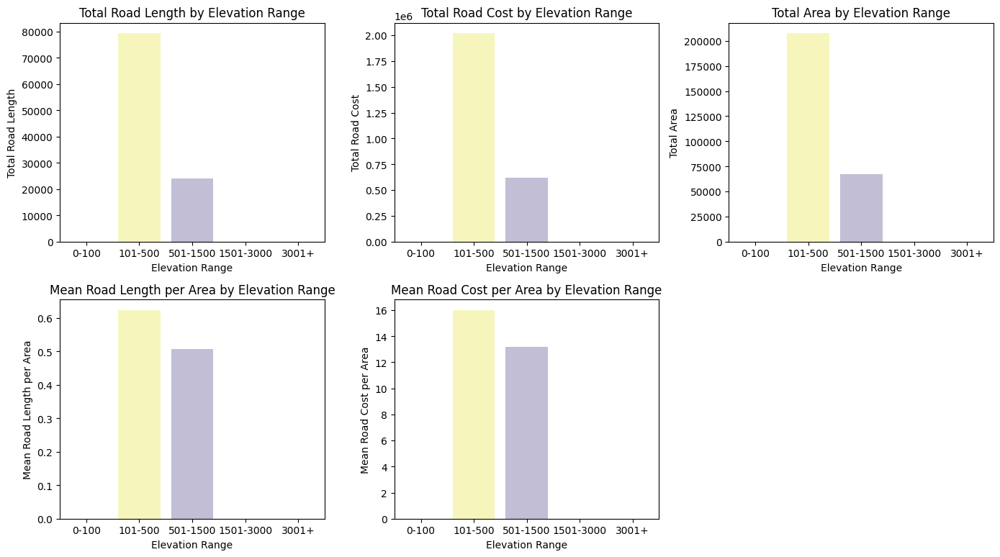

In [51]:
# Plot the results
plt.figure(figsize=(14, 8))

# Plot total road length
plt.subplot(2, 3, 1)
sns.barplot(x='elevation_description', y='total_road_length', data=agg_metrics, palette='Set3')
plt.title('Total Road Length by Elevation Range')
plt.xlabel('Elevation Range')
plt.ylabel('Total Road Length')

# Plot total road cost
plt.subplot(2, 3, 2)
sns.barplot(x='elevation_description', y='total_road_cost', data=agg_metrics, palette='Set3')
plt.title('Total Road Cost by Elevation Range')
plt.xlabel('Elevation Range')
plt.ylabel('Total Road Cost')

# Plot total area
plt.subplot(2, 3, 3)
sns.barplot(x='elevation_description', y='total_area', data=agg_metrics, palette='Set3')
plt.title('Total Area by Elevation Range')
plt.xlabel('Elevation Range')
plt.ylabel('Total Area')

# Plot mean road length per area
plt.subplot(2, 3, 4)
sns.barplot(x='elevation_description', y='mean_road_length_per_sq_km', data=agg_metrics, palette='Set3')
plt.title('Mean Road Length per Area by Elevation Range')
plt.xlabel('Elevation Range')
plt.ylabel('Mean Road Length per Area')

# Plot mean road cost per area
plt.subplot(2, 3, 5)
sns.barplot(x='elevation_description', y='mean_road_cost_per_sq_km', data=agg_metrics, palette='Set3')
plt.title('Mean Road Cost per Area by Elevation Range')
plt.xlabel('Elevation Range')
plt.ylabel('Mean Road Cost per Area')

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_treatment and df_non_treatment are already defined and available

# Assign treatment phases
df_treatment['phase'] = np.where(
    df_treatment['year'] < df_treatment.groupby('shrid')['year'].transform(lambda x: x[df_treatment['completed_road_length'] > 0].min()),
    'treatment-before',
    'treatment-after'
)

# Assign no-treatment phase to non-treatment DataFrame
df_non_treatment['phase'] = 'no-treatment'

# Combine treatment and non-treatment dataframes
df_combined = pd.concat([df_treatment, df_non_treatment])

# Aggregate data by state, year, and phase
state_yearly_agg_2 = df_combined.groupby(['state_name', 'year', 'phase']).agg({
    'night_light_value': 'mean',
    'completed_road_length': 'sum',
    'completed_road_cost': 'sum'
}).reset_index()

state_yearly_agg_2.rename(columns={'night_light_value': 'mean_night_light'}, inplace=True)

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Function to plot night light values for each state
def plot_night_light_state(df):
    # Get unique states
    states = df['state_name'].unique()
    
    # Create a grid of plots
    num_states = len(states)
    num_cols = 1
    num_rows = num_states
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5), sharey=True)
    axes = axes.flatten()
    
    for ax, state in zip(axes, states):
        df_state = df[df['state_name'] == state]
        sns.lineplot(data=df_state[df_state['phase'] == 'treatment-before'], x='year', y='mean_night_light', marker='o', linewidth=2.5, ax=ax, label='Treatment-Before')
        sns.lineplot(data=df_state[df_state['phase'] == 'treatment-after'], x='year', y='mean_night_light', marker='o', linewidth=2.5, ax=ax, label='Treatment-After')
        sns.lineplot(data=df_state[df_state['phase'] == 'no-treatment'], x='year', y='mean_night_light', marker='o', linewidth=2.5, ax=ax, label='No Treatment')
        
        ax.set_title(f'{state}', fontsize=14, weight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Mean Night Light Intensity', fontsize=12)
        ax.legend(title='Phase')
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()

# Plotting the state yearly aggregation
plot_night_light_state(state_yearly_agg_2)


In [102]:
# Aggregate data by zone and year
zone_yearly_agg = df_merged_final_csv.groupby(['zone', 'year']).agg({
    'night_light_value': 'mean',
    'completed_road_length': 'sum',  # sum of cumulative values for each year
    'completed_road_cost': 'sum'     # sum of cumulative values for each year
}).reset_index()

# Rename columns for clarity
zone_yearly_agg.rename(columns={'night_light_value': 'mean_night_light'}, inplace=True)


In [103]:
zone_yearly_agg

,zone,year,mean_night_light,completed_road_length,completed_road_cost
0,Central,1995,3.007527,0.000000,0.000000e+00
1,Central,1996,2.952006,0.000000,0.000000e+00
2,Central,1997,2.190561,0.000000,0.000000e+00
3,Central,1998,2.871226,0.000000,0.000000e+00
4,Central,1999,2.503673,0.000000,0.000000e+00
...,...,...,...,...,...
151,Western,2016,8.538712,56578.039945,1.452185e+06
152,Western,2017,9.926668,56578.039945,1.452185e+06
153,Western,2018,10.384709,56578.039945,1.452185e+06
154,Western,2019,11.137613,56578.039945,1.452185e+06


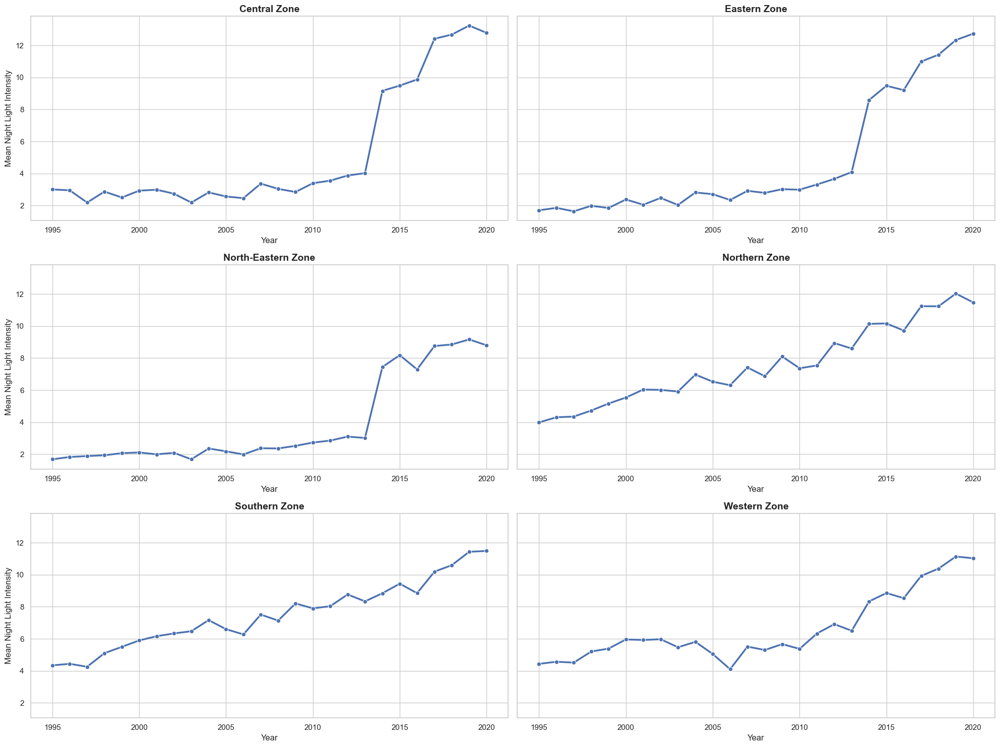

In [104]:
# Function to plot night light values for each zone
def plot_night_light_zone(df):
    # Get unique zones
    zones = df['zone'].unique()
    
    # Create a grid of plots
    num_zones = len(zones)
    num_cols = 2
    num_rows = (num_zones + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5), sharey=True)
    axes = axes.flatten()
    
    for ax, zone in zip(axes, zones):
        df_zone = df[df['zone'] == zone]
        sns.lineplot(data=df_zone, x='year', y='mean_night_light', marker='o', linewidth=2.5, ax=ax)
        ax.set_title(f'{zone} Zone', fontsize=14, weight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Mean Night Light Intensity', fontsize=12)
        ax.grid(True)
    
    # Remove any empty subplots
    for i in range(num_zones, len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

# Plotting the zone yearly aggregation
plot_night_light_zone(zone_yearly_agg)


In [105]:
import pandas as pd

# Aggregate data by state and year
state_yearly_agg = df_merged_final_csv.groupby(['state_name', 'year']).agg({
    'night_light_value': 'mean',
    'completed_road_length': 'sum',  # sum of cumulative values for each year
    'completed_road_cost': 'sum'     # sum of cumulative values for each year
}).reset_index()

# Rename columns for clarity
state_yearly_agg.rename(columns={'night_light_value': 'mean_night_light'}, inplace=True)


In [106]:
state_yearly_agg

,state_name,year,mean_night_light,completed_road_length,completed_road_cost
0,Andaman & Nicobar,1995,1.911317,0.000000,0.000000e+00
1,Andaman & Nicobar,1996,1.842444,0.000000,0.000000e+00
2,Andaman & Nicobar,1997,1.381907,0.000000,0.000000e+00
3,Andaman & Nicobar,1998,1.742496,0.000000,0.000000e+00
4,Andaman & Nicobar,1999,1.648789,0.000000,0.000000e+00
...,...,...,...,...,...
931,West Bengal,2016,10.724280,61056.220014,2.244757e+06
932,West Bengal,2017,12.236329,61056.220014,2.244757e+06
933,West Bengal,2018,12.327015,61598.340014,2.275348e+06
934,West Bengal,2019,12.863345,61598.340014,2.275348e+06


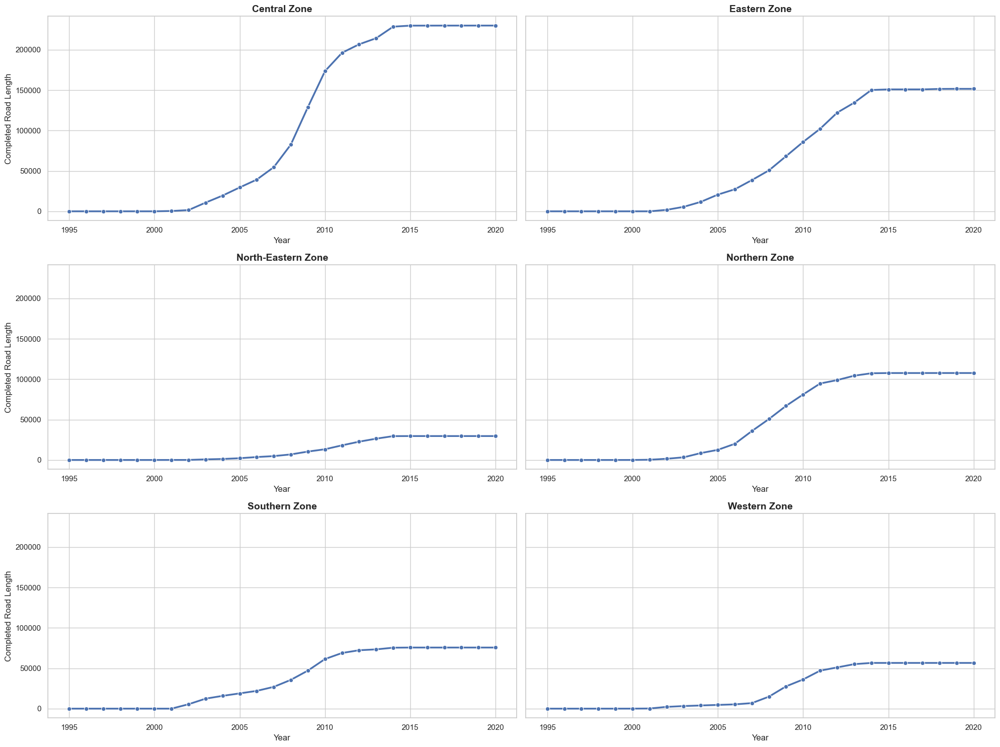

In [110]:
# Function to plot night light values vs completed road length for each zone
def plot_night_light_vs_road_length_zone(df):
    # Get unique zones
    zones = df['zone'].unique()
    
    # Create a grid of plots
    num_zones = len(zones)
    num_cols = 2
    num_rows = (num_zones + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5), sharey=True)
    axes = axes.flatten()
    
    for ax, zone in zip(axes, zones):
        df_zone = df[df['zone'] == zone]
        sns.lineplot(data=df_zone, x='year', y='completed_road_length', marker='o', linewidth=2.5, ax=ax)
        ax.set_title(f'{zone} Zone', fontsize=14, weight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Completed Road Length', fontsize=12)
        ax.grid(True)
    
    # Remove any empty subplots
    for i in range(num_zones, len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

# Plotting the zone yearly aggregation for completed road length
plot_night_light_vs_road_length_zone(zone_yearly_agg)


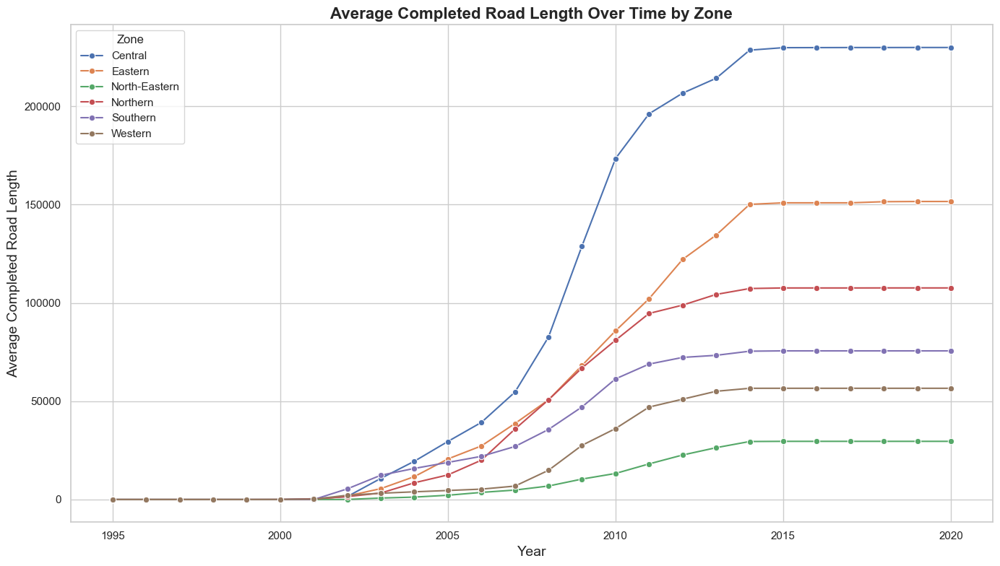

In [117]:
#Line Plot of Average Completed Road Length Over Time by Zone

def plot_line_avg_road_length_over_time_by_zone(df):
    plt.figure(figsize=(14, 8))
    sns.lineplot(data=df, x='year', y='completed_road_length', hue='zone', marker='o')
    plt.title('Average Completed Road Length Over Time by Zone', fontsize=16, weight='bold')
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Average Completed Road Length', fontsize=14)
    plt.legend(title='Zone')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_line_avg_road_length_over_time_by_zone(zone_yearly_agg)


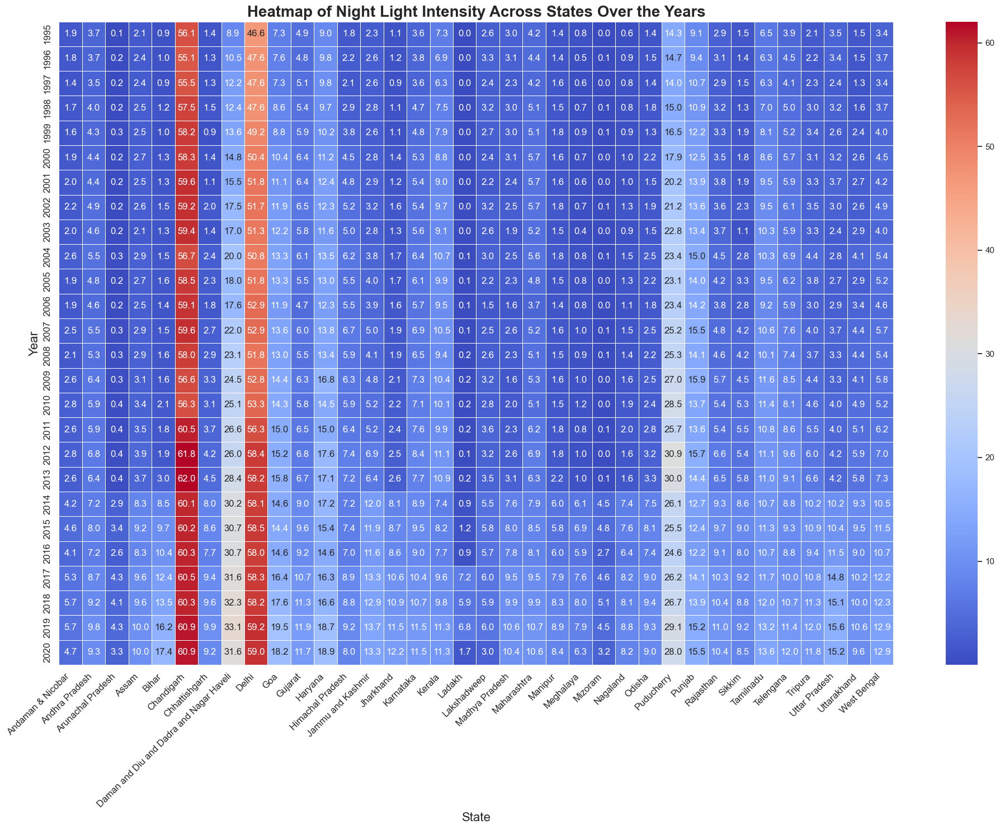

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot heatmap of night light intensity across states over the years
def plot_heatmap_night_light_state(df):
    # Create a pivot table
    pivot_table = df.pivot_table(index='year', columns='state_name', values='mean_night_light', fill_value=0)
    
    plt.figure(figsize=(20, 15))
    sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".1f", linewidths=.5)
    plt.title('Heatmap of Night Light Intensity Across States Over the Years', fontsize=20, weight='bold')
    plt.xlabel('State', fontsize=16)
    plt.ylabel('Year', fontsize=16)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

plot_heatmap_night_light_state(state_yearly_agg)



In [122]:
# Split the data into treatment and non-treatment dataframes
df_treatment = df_merged_final_csv[df_merged_final_csv['treatment'] == 1].copy()
df_non_treatment = df_merged_final_csv[df_merged_final_csv['treatment'] == 0].copy()


In [134]:
df_treatment

,shrid,year,completed_road_length,completed_road_cost,before,after,treatment,night_light_year,night_light_value,state_name,zone,geometry
2880176,01-03-01-0002-00008200,1995,0.0,0.0,1,0,1,NaN,NaN,NaN,NaN,NaN
2880177,01-03-01-0002-00008200,1996,0.0,0.0,1,0,1,NaN,NaN,NaN,NaN,NaN
2880178,01-03-01-0002-00008200,1997,0.0,0.0,1,0,1,NaN,NaN,NaN,NaN,NaN
2880179,01-03-01-0002-00008200,1998,0.0,0.0,1,0,1,NaN,NaN,NaN,NaN,NaN
2880180,01-03-01-0002-00008200,1999,0.0,0.0,1,0,1,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2880171,11-33-633-05907-644915,2016,1.7,34.0,0,1,1,2016.0,9.183749,Tamilnadu,Southern,POLYGON ((8606775.318064513 1182452.1856249066...
2880172,11-33-633-05907-644915,2017,1.7,34.0,0,1,1,2017.0,9.901189,Tamilnadu,Southern,POLYGON ((8606775.318064513 1182452.1856249066...
2880173,11-33-633-05907-644915,2018,1.7,34.0,0,1,1,2018.0,10.019111,Tamilnadu,Southern,POLYGON ((8606775.318064513 1182452.1856249066...
2880174,11-33-633-05907-644915,2019,1.7,34.0,0,1,1,2019.0,10.821914,Tamilnadu,Southern,POLYGON ((8606775.318064513 1182452.1856249066...


In [127]:
# Check the number of NaN values per column
nan_counts_1 = df_treatment.isna().sum()

In [129]:
nan_counts_1

shrid                        0
year                         0
completed_road_length        0
completed_road_cost          0
before                       0
after                        0
treatment                    0
night_light_year         44694
night_light_value        44694
state_name               44876
zone                     44876
geometry                 44694
dtype: int64

In [135]:
df_treatment = df_treatment.dropna()

In [124]:
df_non_treatment

,shrid,year,completed_road_length,completed_road_cost,before,after,treatment,night_light_year,night_light_value,state_name,zone,geometry
5760352,11-09-165-00853-151418,1995,0.0,0.0,1,0,0,1995.0,0.000000,Uttar Pradesh,Central,"POLYGON ((8851862.71696788 3024067.5502902097,..."
5760353,11-09-165-00853-151418,1996,0.0,0.0,1,0,0,1996.0,0.000000,Uttar Pradesh,Central,"POLYGON ((8851862.71696788 3024067.5502902097,..."
5760354,11-09-165-00853-151418,1997,0.0,0.0,1,0,0,1997.0,0.080460,Uttar Pradesh,Central,"POLYGON ((8851862.71696788 3024067.5502902097,..."
5760355,11-09-165-00853-151418,1998,0.0,0.0,1,0,0,1998.0,0.000000,Uttar Pradesh,Central,"POLYGON ((8851862.71696788 3024067.5502902097,..."
5760356,11-09-165-00853-151418,1999,0.0,0.0,1,0,0,1999.0,0.000000,Uttar Pradesh,Central,"POLYGON ((8851862.71696788 3024067.5502902097,..."
...,...,...,...,...,...,...,...,...,...,...,...,...
14912763,11-35-640-05924-645570,2016,0.0,0.0,1,0,0,2016.0,3.499524,Andaman & Nicobar,Southern,POLYGON ((10294826.537393697 1184603.131206845...
14912764,11-35-640-05924-645570,2017,0.0,0.0,1,0,0,2017.0,3.536485,Andaman & Nicobar,Southern,POLYGON ((10294826.537393697 1184603.131206845...
14912765,11-35-640-05924-645570,2018,0.0,0.0,1,0,0,2018.0,3.526015,Andaman & Nicobar,Southern,POLYGON ((10294826.537393697 1184603.131206845...
14912766,11-35-640-05924-645570,2019,0.0,0.0,1,0,0,2019.0,3.826459,Andaman & Nicobar,Southern,POLYGON ((10294826.537393697 1184603.131206845...


In [126]:
# Check the number of NaN values per column
nan_counts = df_non_treatment.isna().sum()

In [128]:
nan_counts

shrid                       0
year                        0
completed_road_length       0
completed_road_cost         0
before                      0
after                       0
treatment                   0
night_light_year         4394
night_light_value        4625
state_name               6006
zone                     7696
geometry                 4394
dtype: int64

C:\Users\Burhan\AppData\Local\Temp\ipykernel_15232\3993016047.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_treatment['phase'] = np.where(
C:\Users\Burhan\AppData\Local\Temp\ipykernel_15232\3993016047.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_non_treatment['phase'] = 'no-treatment'


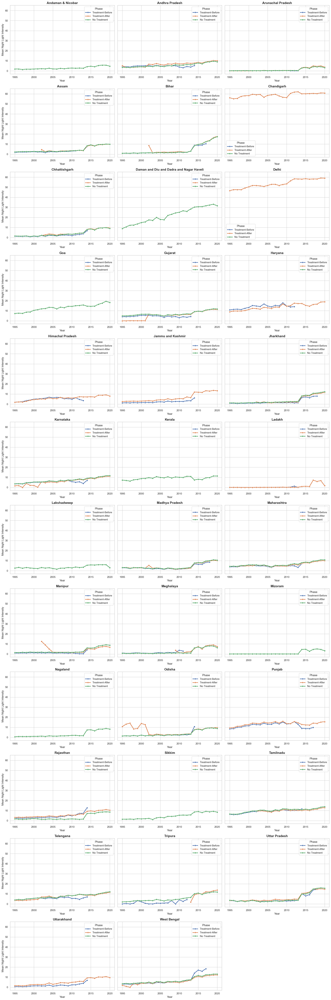

In [140]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df_treatment and df_non_treatment are already defined and available

# Assign treatment phases
df_treatment['phase'] = np.where(
    df_treatment['year'] < df_treatment.groupby('shrid')['year'].transform(lambda x: x[df_treatment['completed_road_length'] > 0].min()),
    'treatment-before',
    'treatment-after'
)

# Assign no-treatment phase to non-treatment DataFrame
df_non_treatment['phase'] = 'no-treatment'

# Combine treatment and non-treatment dataframes
df_combined = pd.concat([df_treatment, df_non_treatment])

# Aggregate data by state, year, and phase
state_yearly_agg_2 = df_combined.groupby(['state_name', 'year', 'phase']).agg({
    'night_light_value': 'mean',
    'completed_road_length': 'sum',
    'completed_road_cost': 'sum'
}).reset_index()

state_yearly_agg_2.rename(columns={'night_light_value': 'mean_night_light'}, inplace=True)

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Function to plot night light values for each state
def plot_night_light_state(df):
    # Get unique states
    states = df['state_name'].unique()
    
    # Create a grid of plots
    num_states = len(states)
    num_cols = 3
    num_rows = (num_states + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5), sharey=True)
    axes = axes.flatten()
    
    for ax, state in zip(axes, states):
        df_state = df[df['state_name'] == state]
        sns.lineplot(data=df_state[df_state['phase'] == 'treatment-before'], x='year', y='mean_night_light', marker='o', linewidth=2.5, ax=ax, label='Treatment-Before')
        sns.lineplot(data=df_state[df_state['phase'] == 'treatment-after'], x='year', y='mean_night_light', marker='o', linewidth=2.5, ax=ax, label='Treatment-After')
        sns.lineplot(data=df_state[df_state['phase'] == 'no-treatment'], x='year', y='mean_night_light', marker='o', linewidth=2.5, ax=ax, label='No Treatment')
        
        ax.set_title(f'{state}', fontsize=14, weight='bold')
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Mean Night Light Intensity', fontsize=12)
        ax.legend(title='Phase')
        ax.grid(True)
    
    # Remove any empty subplots
    for i in range(num_states, len(axes)):
        fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

# Plotting the state yearly aggregation
plot_night_light_state(state_yearly_agg_2)


In [8]:
import pandas as pd
import geopandas as gpd
from shapely import wkt
import matplotlib.pyplot as plt


# Ensure the 'geometry' column is treated as strings
df_merged_final_csv['geometry'] = df_merged_final_csv['geometry'].astype(str)

# Function to safely load WKT
def safe_wkt_loads(x):
    try:
        return wkt.loads(x)
    except:
        return None

# Convert the 'geometry' column from WKT to GeoSeries
df_merged_final_csv['geometry'] = df_merged_final_csv['geometry'].apply(safe_wkt_loads)

# Drop rows with invalid geometries
df_merged_final_csv = df_merged_final_csv.dropna(subset=['geometry'])

# Convert the dataframe to a GeoDataFrame
gdf_merged_final = gpd.GeoDataFrame(df_merged_final_csv, geometry='geometry')


In [10]:
# Convert 'year' and 'night_light_year' to integers for better plotting
df_merged_final_csv['year'] = df_merged_final_csv['year'].astype(int)
df_merged_final_csv['night_light_year'] = df_merged_final_csv['night_light_year'].astype(int)

C:\Users\Burhan\AppData\Local\Temp\ipykernel_15232\1275860467.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merged_final_csv['year'] = df_merged_final_csv['year'].astype(int)
C:\Users\Burhan\AppData\Local\Temp\ipykernel_15232\1275860467.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merged_final_csv['night_light_year'] = df_merged_final_csv['night_light_year'].astype(int)


In [32]:
# Define a function to improve the plotting
def plot_night_light_for_state(data, state, y, title, ylabel):
    plt.figure(figsize=(14, 7), dpi=100)
    
    sns.lineplot(data=data[(data['state_name'] == state) & (data['phase'] == 'treatment-before')], 
                 x='year', y=y, label='Treatment-Before', linewidth=2.5)
    #sns.lineplot(data=data[(data['state_name'] == state) & (data['phase'] == 'treatment-during')], 
                 #x='year', y=y, label='Treatment-During', linewidth=2.5)
    sns.lineplot(data=data[(data['state_name'] == state) & (data['phase'] == 'treatment-after')], 
                 x='year', y=y, label='Treatment-After', linewidth=2.5)
    sns.lineplot(data=data[(data['state_name'] == state) & (data['phase'] == 'no treatment')], 
                 x='year', y=y, label='No Treatment', linewidth=2.5)
    
    plt.title(f'{title} for {state}', fontsize=16, weight='bold')
    plt.xlabel('Year', fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.legend(title='Construction Phases', fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()



In [34]:
# Aggregate different statistics by zone, year, and phase
zone_yearly_agg = df_merged_final_csv.groupby(['zone', 'year', 'phase']).agg({
    'night_light_value': ['mean', 'median', 'sum', 'std']
}).reset_index()

# Flatten the MultiIndex columns
zone_yearly_agg.columns = ['zone', 'year', 'phase', 'mean_night_light', 'median_night_light', 'sum_night_light', 'std_night_light']

In [39]:
# Define a function to improve the plotting
def plot_night_light_for_zone(data, zone, y, title, ylabel):
    plt.figure(figsize=(14, 7), dpi=100)
    
    sns.lineplot(data=data[(data['zone'] == zone) & (data['phase'] == 'treatment-before')], 
                 x='year', y=y, label='Treatment-Before', linewidth=2.5)
    #sns.lineplot(data=data[(data['zone'] == zone) & (data['phase'] == 'treatment-during')], 
                 #x='year', y=y, label='Treatment-During', linewidth=2.5)
    sns.lineplot(data=data[(data['zone'] == zone) & (data['phase'] == 'treatment-after')], 
                 x='year', y=y, label='Treatment-After', linewidth=2.5)
    #sns.lineplot(data=data[(data['zone'] == zone) & (data['phase'] == 'no treatment')], 
                 #x='year', y=y, label='No Treatment', linewidth=2.5)
    
    plt.title(f'{title} for {zone} Zone', fontsize=16, weight='bold')
    plt.xlabel('Year', fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.legend(title='Construction Phases', fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [57]:
# Convert the dataframe to a GeoDataFrame
gdf = gpd.GeoDataFrame(df_merged_final_csv, geometry='geometry')

# Filter data for the specific state and years
state_name = 'Northern'  # replace with the actual state name
gdf_state = gdf[(gdf['state_name'] == state_name) & (gdf['year'] >= 1995) & (gdf['year'] <= 2020)]

In [53]:
# Ensure the geometry is not null
gdf_state = gdf_state[gdf_state['geometry'].notnull()]

# Aggregate night light values by year and geometry
gdf_state_agg = gdf_state.groupby(['year', 'geometry']).agg({
    'night_light_value': 'mean'
}).reset_index()

# Convert the aggregated dataframe back to a GeoDataFrame
gdf_state_agg = gpd.GeoDataFrame(gdf_state_agg, geometry='geometry')


<Figure size 1000x1000 with 0 Axes>

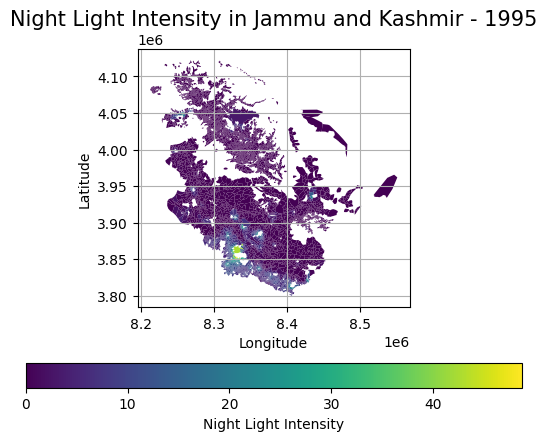

In [54]:
def plot_night_light_map(gdf, year, state_name):
    plt.figure(figsize=(10, 10))
    gdf_year = gdf[gdf['year'] == year]
    gdf_year.plot(column='night_light_value', cmap='viridis', legend=True, 
                  legend_kwds={'label': "Night Light Intensity", 'orientation': "horizontal"})
    
    plt.title(f'Night Light Intensity in {state_name} - {year}', fontsize=15)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True)
    plt.show()


# Example for plotting a specific year
plot_night_light_map(gdf_state_agg, 1995, state_name)


<Figure size 1000x1000 with 0 Axes>

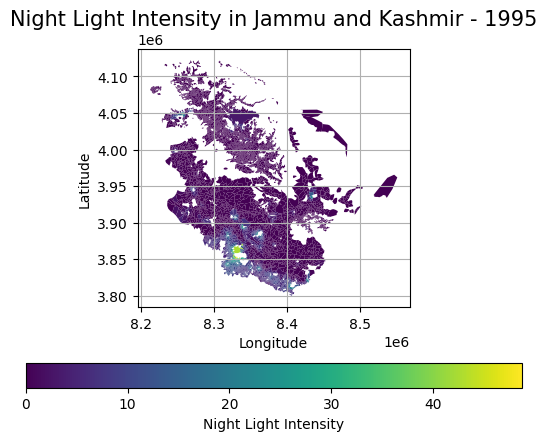

<Figure size 1000x1000 with 0 Axes>

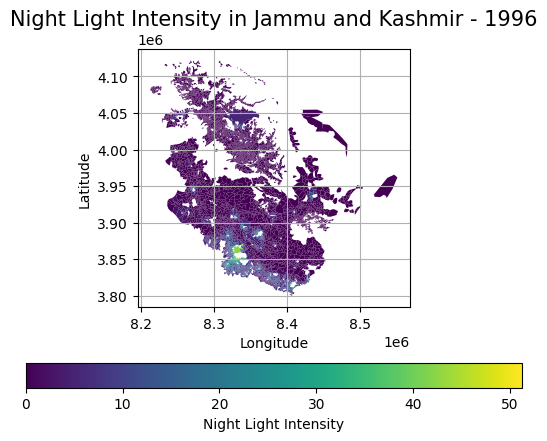

<Figure size 1000x1000 with 0 Axes>

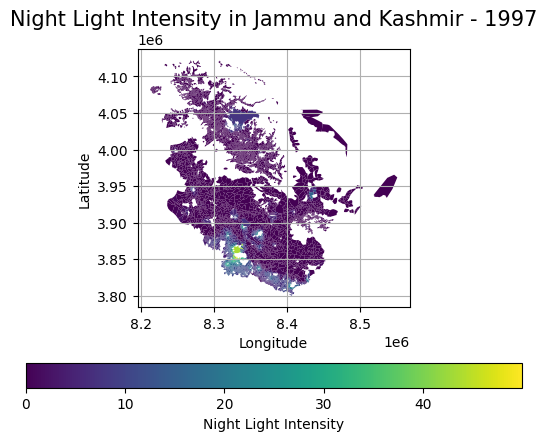

<Figure size 1000x1000 with 0 Axes>

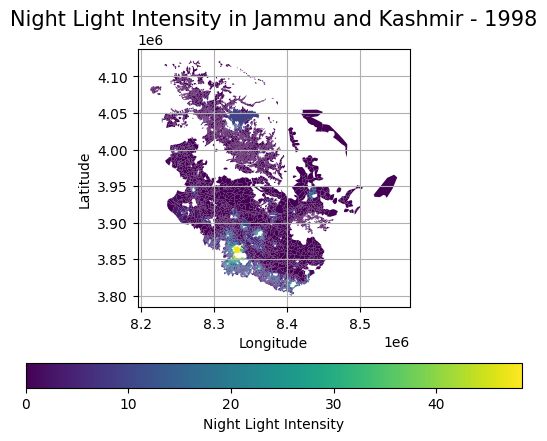

<Figure size 1000x1000 with 0 Axes>

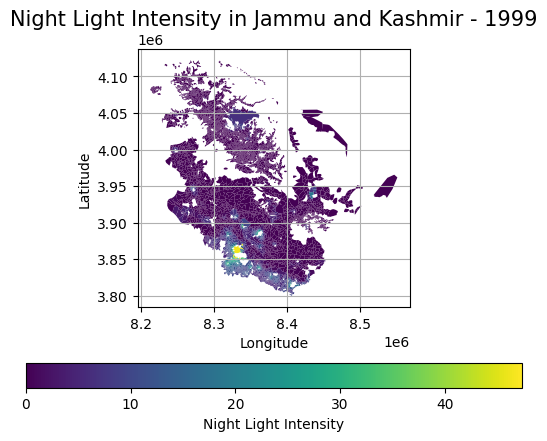

<Figure size 1000x1000 with 0 Axes>

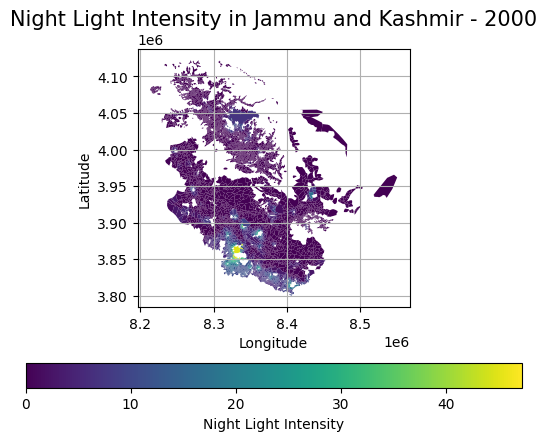

<Figure size 1000x1000 with 0 Axes>

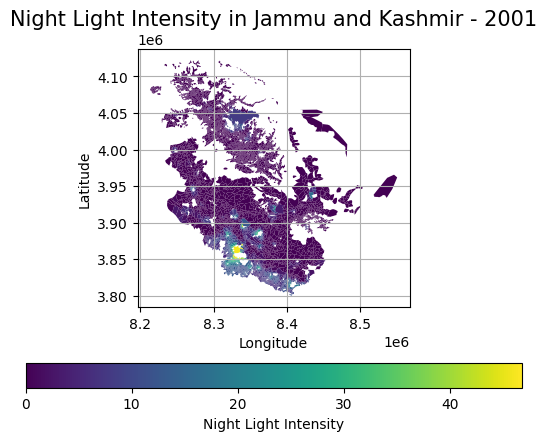

<Figure size 1000x1000 with 0 Axes>

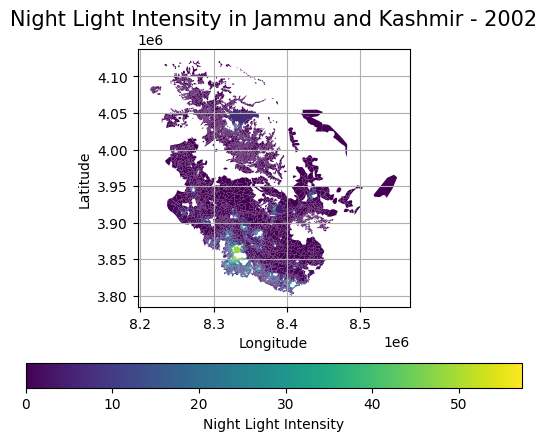

<Figure size 1000x1000 with 0 Axes>

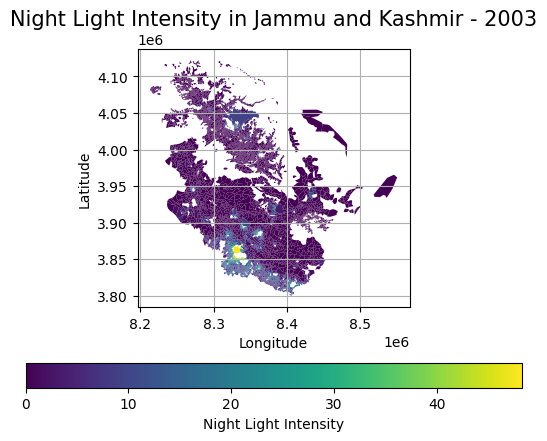

<Figure size 1000x1000 with 0 Axes>

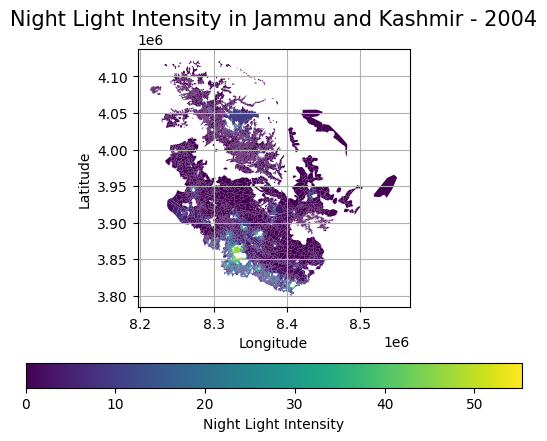

<Figure size 1000x1000 with 0 Axes>

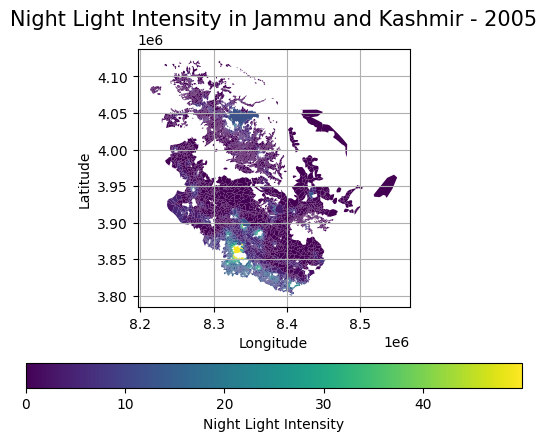

<Figure size 1000x1000 with 0 Axes>

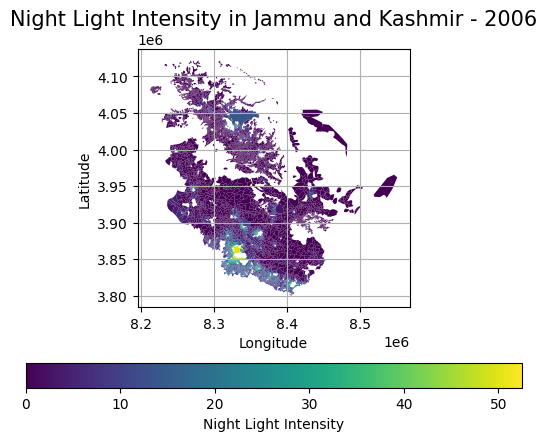

<Figure size 1000x1000 with 0 Axes>

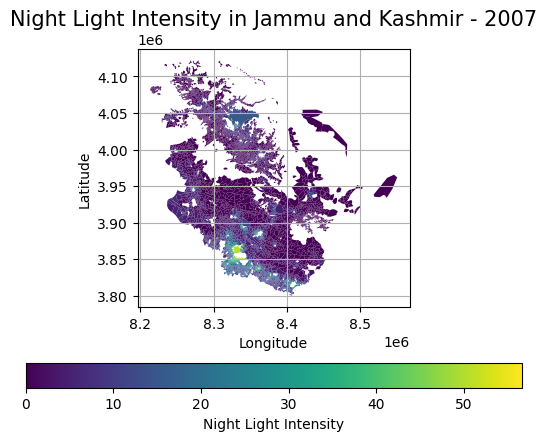

<Figure size 1000x1000 with 0 Axes>

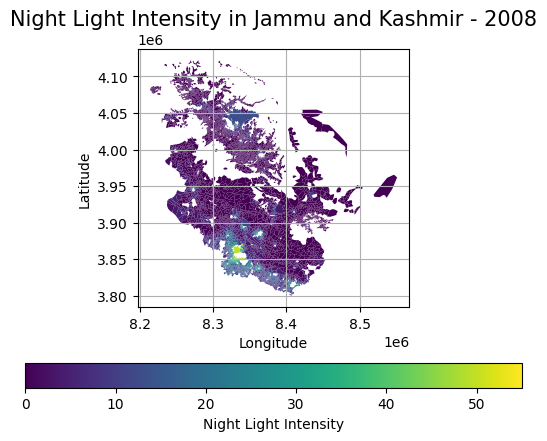

<Figure size 1000x1000 with 0 Axes>

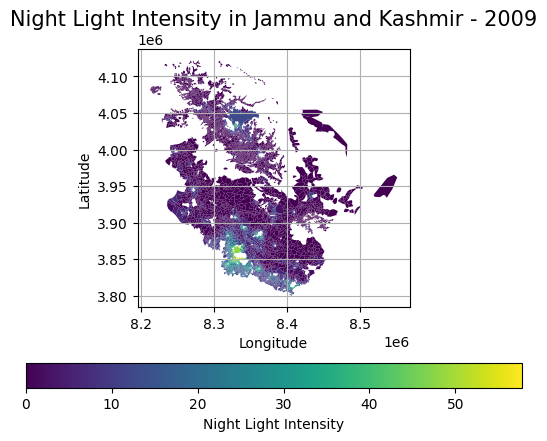

<Figure size 1000x1000 with 0 Axes>

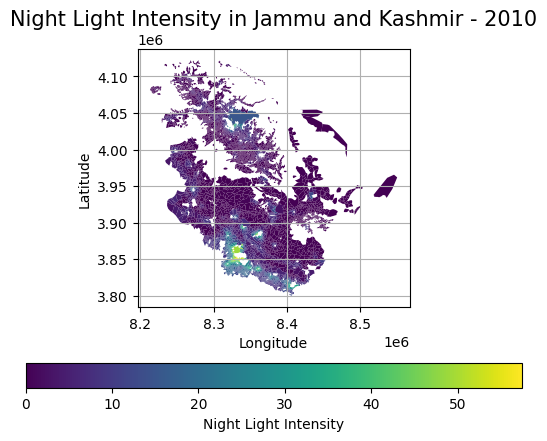

<Figure size 1000x1000 with 0 Axes>

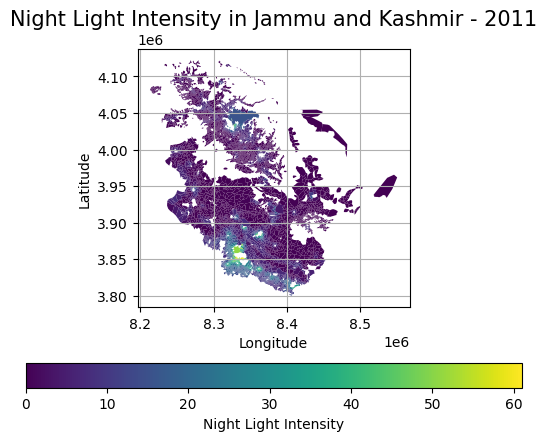

<Figure size 1000x1000 with 0 Axes>

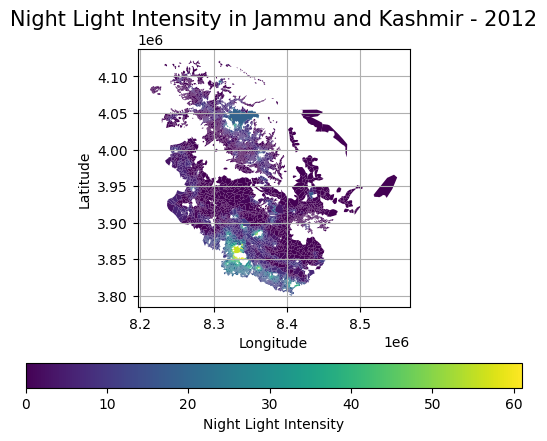

<Figure size 1000x1000 with 0 Axes>

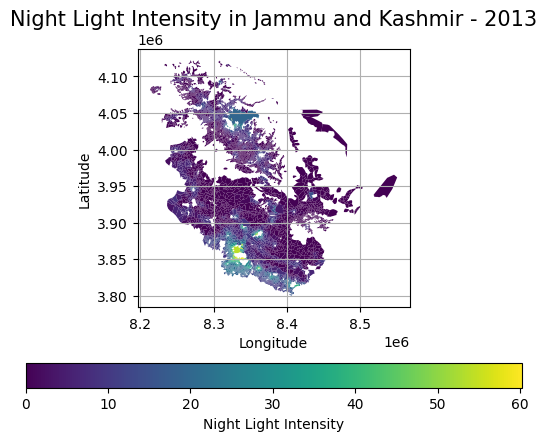

<Figure size 1000x1000 with 0 Axes>

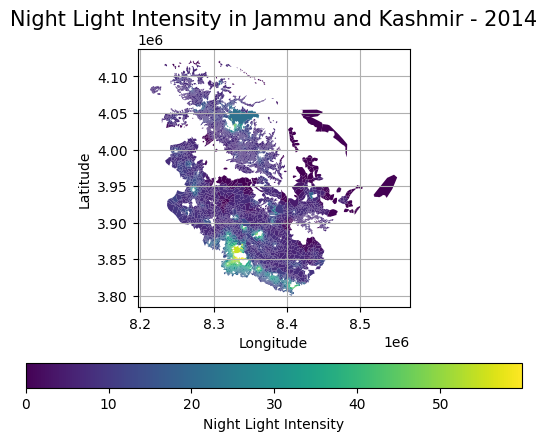

<Figure size 1000x1000 with 0 Axes>

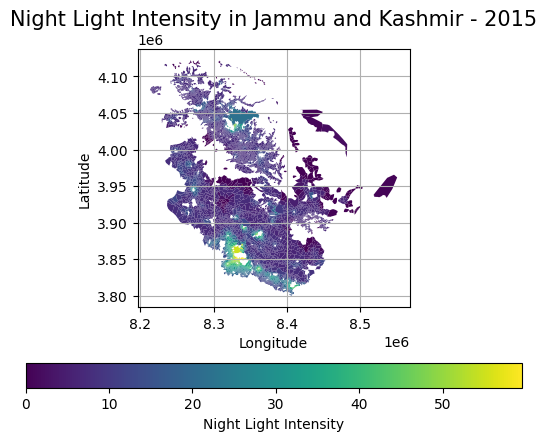

<Figure size 1000x1000 with 0 Axes>

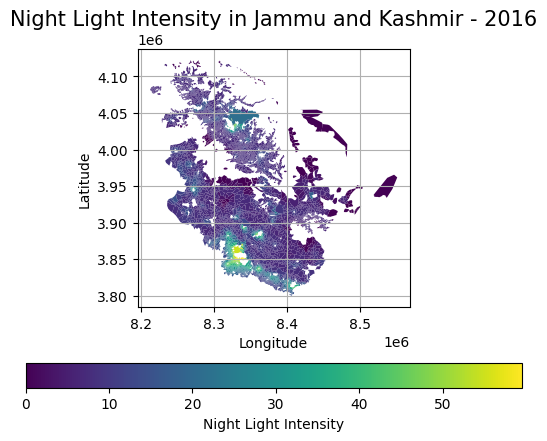

<Figure size 1000x1000 with 0 Axes>

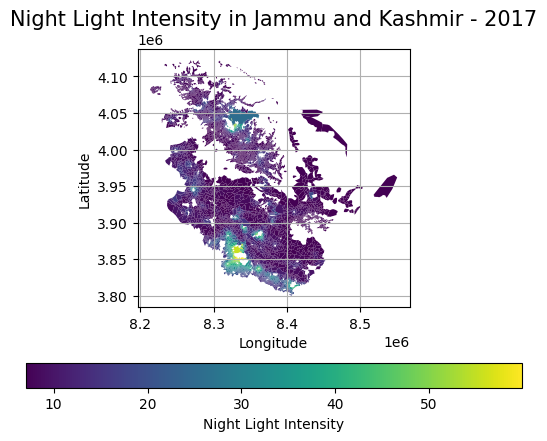

<Figure size 1000x1000 with 0 Axes>

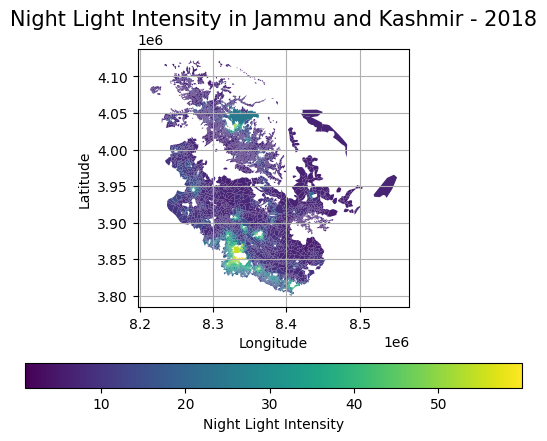

<Figure size 1000x1000 with 0 Axes>

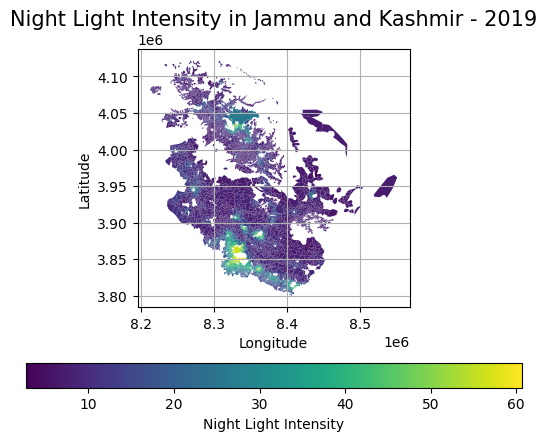

C:\Users\Burhan\AppData\Local\Temp\ipykernel_15232\3390675772.py:4: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_year.plot(column='night_light_value', cmap='viridis', legend=True,


<Figure size 1000x1000 with 0 Axes>

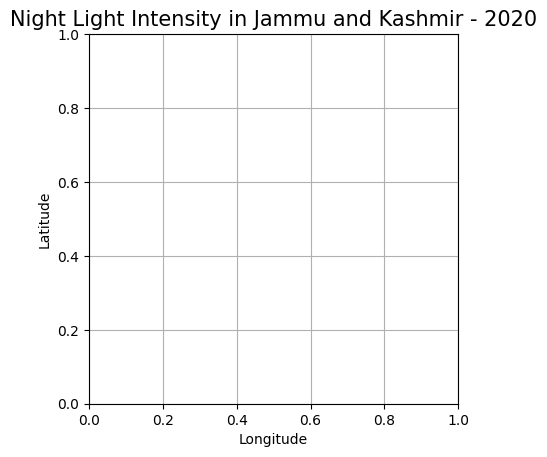

In [56]:
# Plot night light maps for each year from 1995 to 2020
for year in range(1995, 2021):
    plot_night_light_map(gdf_state_agg, year, state_name)